<a href="https://colab.research.google.com/github/johncduran/HHA-550-Assignments/blob/main/Copy_of_Summer_2024_Qualtrics_Survey_(_SBU_Athletics).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Importing

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro, ttest_ind, mannwhitneyu, chi2_contingency
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [ ]:
pd.read_csv('/content/Organizational Values Survey_July 22, 2024_10.50.csv')

,Q11,Q10,Q2#1_1,Q2#1_2,Q2#1_3,Q2#1_4,Q2#1_5,Q2#1_6,Q2#1_7,Q2#1_8,...,Q5#2_4,Q5#2_5,Q5#2_6,Q5#2_7,Q5#2_8,Q5#2_9,Q7,Q8,Q10.1,Q11.1
0,Select your department,Select your role,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,...,• A competitive culture is a results-based wor...,• A competitive culture is a results-based wor...,• A competitive culture is a results-based wor...,• A competitive culture is a results-based wor...,• A competitive culture is a results-based wor...,• A competitive culture is a results-based wor...,Does your team or unit have established values...,How would you describe our department's curren...,If you had to pick 5 values for our strategic ...,Additional Comments Welcomed!
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,"Facility, Equipment and Business Operations",Staff,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100,Sports Performance,Coach,3,3,2,2,2,4,2,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Seeing if I can actually see the dataset

In [ ]:
file_path = '/content/Organizational Values Survey_July 22, 2024_10.50.csv'
data = pd.read_csv(file_path)
data.head()

,Q11,Q10,Q2#1_1,Q2#1_2,Q2#1_3,Q2#1_4,Q2#1_5,Q2#1_6,Q2#1_7,Q2#1_8,...,Q5#2_4,Q5#2_5,Q5#2_6,Q5#2_7,Q5#2_8,Q5#2_9,Q7,Q8,Q10.1,Q11.1
0,Select your department,Select your role,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,• A creative culture has a dynamic and creativ...,...,• A competitive culture is a results-based wor...,• A competitive culture is a results-based wor...,• A competitive culture is a results-based wor...,• A competitive culture is a results-based wor...,• A competitive culture is a results-based wor...,• A competitive culture is a results-based wor...,Does your team or unit have established values...,How would you describe our department's curren...,If you had to pick 5 values for our strategic ...,Additional Comments Welcomed!
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Looking at the columns to see which to choose

In [ ]:
data.columns


Index(['Q11', 'Q10', 'Q2#1_1', 'Q2#1_2', 'Q2#1_3', 'Q2#1_4', 'Q2#1_5',
       'Q2#1_6', 'Q2#1_7', 'Q2#1_8', 'Q2#1_9', 'Q2#1_10', 'Q2#1_11', 'Q2#2_1',
       'Q2#2_2', 'Q2#2_3', 'Q2#2_4', 'Q2#2_5', 'Q2#2_6', 'Q2#2_7', 'Q2#2_8',
       'Q2#2_9', 'Q2#2_10', 'Q2#2_11', 'Q3#1_1', 'Q3#1_2', 'Q3#1_3', 'Q3#1_4',
       'Q3#1_5', 'Q3#1_6', 'Q3#1_7', 'Q3#1_8', 'Q3#1_9', 'Q3#1_10', 'Q3#1_11',
       'Q3#2_1', 'Q3#2_2', 'Q3#2_3', 'Q3#2_4', 'Q3#2_5', 'Q3#2_6', 'Q3#2_7',
       'Q3#2_8', 'Q3#2_9', 'Q3#2_10', 'Q3#2_11', 'Q4#1_1', 'Q4#1_2', 'Q4#1_3',
       'Q4#1_4', 'Q4#1_5', 'Q4#1_6', 'Q4#1_7', 'Q4#1_8', 'Q4#1_9', 'Q4#2_1',
       'Q4#2_2', 'Q4#2_3', 'Q4#2_4', 'Q4#2_5', 'Q4#2_6', 'Q4#2_7', 'Q4#2_8',
       'Q4#2_9', 'Q5#1_1', 'Q5#1_2', 'Q5#1_3', 'Q5#1_4', 'Q5#1_5', 'Q5#1_6',
       'Q5#1_7', 'Q5#1_8', 'Q5#1_9', 'Q5#2_1', 'Q5#2_2', 'Q5#2_3', 'Q5#2_4',
       'Q5#2_5', 'Q5#2_6', 'Q5#2_7', 'Q5#2_8', 'Q5#2_9', 'Q7', 'Q8', 'Q10.1',
       'Q11.1'],
      dtype='object')

In [ ]:
# I thought it couldn't see all the columns becuase they weren't there but then I found out it was because
# there were too many and so python truncates them. I found this code to display them all

In [ ]:
print(data.columns.tolist())

['Q11', 'Q10', 'Q2#1_1', 'Q2#1_2', 'Q2#1_3', 'Q2#1_4', 'Q2#1_5', 'Q2#1_6', 'Q2#1_7', 'Q2#1_8', 'Q2#1_9', 'Q2#1_10', 'Q2#1_11', 'Q2#2_1', 'Q2#2_2', 'Q2#2_3', 'Q2#2_4', 'Q2#2_5', 'Q2#2_6', 'Q2#2_7', 'Q2#2_8', 'Q2#2_9', 'Q2#2_10', 'Q2#2_11', 'Q3#1_1', 'Q3#1_2', 'Q3#1_3', 'Q3#1_4', 'Q3#1_5', 'Q3#1_6', 'Q3#1_7', 'Q3#1_8', 'Q3#1_9', 'Q3#1_10', 'Q3#1_11', 'Q3#2_1', 'Q3#2_2', 'Q3#2_3', 'Q3#2_4', 'Q3#2_5', 'Q3#2_6', 'Q3#2_7', 'Q3#2_8', 'Q3#2_9', 'Q3#2_10', 'Q3#2_11', 'Q4#1_1', 'Q4#1_2', 'Q4#1_3', 'Q4#1_4', 'Q4#1_5', 'Q4#1_6', 'Q4#1_7', 'Q4#1_8', 'Q4#1_9', 'Q4#2_1', 'Q4#2_2', 'Q4#2_3', 'Q4#2_4', 'Q4#2_5', 'Q4#2_6', 'Q4#2_7', 'Q4#2_8', 'Q4#2_9', 'Q5#1_1', 'Q5#1_2', 'Q5#1_3', 'Q5#1_4', 'Q5#1_5', 'Q5#1_6', 'Q5#1_7', 'Q5#1_8', 'Q5#1_9', 'Q5#2_1', 'Q5#2_2', 'Q5#2_3', 'Q5#2_4', 'Q5#2_5', 'Q5#2_6', 'Q5#2_7', 'Q5#2_8', 'Q5#2_9', 'Q7', 'Q8', 'Q10.1', 'Q11.1']


In [ ]:
# Renamed columns for easier
data.rename(columns={'Q11': 'Department', 'Q10': 'Group'}, inplace=True)

In [ ]:
# Checkd columns after renaming
print(data.columns.tolist())


['Department', 'Group', 'Q2#1_1', 'Q2#1_2', 'Q2#1_3', 'Q2#1_4', 'Q2#1_5', 'Q2#1_6', 'Q2#1_7', 'Q2#1_8', 'Q2#1_9', 'Q2#1_10', 'Q2#1_11', 'Q2#2_1', 'Q2#2_2', 'Q2#2_3', 'Q2#2_4', 'Q2#2_5', 'Q2#2_6', 'Q2#2_7', 'Q2#2_8', 'Q2#2_9', 'Q2#2_10', 'Q2#2_11', 'Q3#1_1', 'Q3#1_2', 'Q3#1_3', 'Q3#1_4', 'Q3#1_5', 'Q3#1_6', 'Q3#1_7', 'Q3#1_8', 'Q3#1_9', 'Q3#1_10', 'Q3#1_11', 'Q3#2_1', 'Q3#2_2', 'Q3#2_3', 'Q3#2_4', 'Q3#2_5', 'Q3#2_6', 'Q3#2_7', 'Q3#2_8', 'Q3#2_9', 'Q3#2_10', 'Q3#2_11', 'Q4#1_1', 'Q4#1_2', 'Q4#1_3', 'Q4#1_4', 'Q4#1_5', 'Q4#1_6', 'Q4#1_7', 'Q4#1_8', 'Q4#1_9', 'Q4#2_1', 'Q4#2_2', 'Q4#2_3', 'Q4#2_4', 'Q4#2_5', 'Q4#2_6', 'Q4#2_7', 'Q4#2_8', 'Q4#2_9', 'Q5#1_1', 'Q5#1_2', 'Q5#1_3', 'Q5#1_4', 'Q5#1_5', 'Q5#1_6', 'Q5#1_7', 'Q5#1_8', 'Q5#1_9', 'Q5#2_1', 'Q5#2_2', 'Q5#2_3', 'Q5#2_4', 'Q5#2_5', 'Q5#2_6', 'Q5#2_7', 'Q5#2_8', 'Q5#2_9', 'Q7', 'Q8', 'Q10.1', 'Q11.1']


In [ ]:

# Filter columns with pattern "Q2#1_"
# I got rid of the columsn with a 2_ in the since those were yes and no answers, I wasnt sure if she wanted those or not
questions_cols = [col for col in data.columns if '#1_' in col]

In [ ]:
# Separated the data into two groups: coaches and staff
coaches_data = data[data['Group'] == 'Coach']
staff_data = data[data['Group'] == 'Staff']


Data Cleaning

In [ ]:
num_rows_before = data.shape[0]
print (f"Number of rows before: {num_rows_before}")

Number of rows before: 103


In [ ]:
data.dropna(how='all', inplace=True)

In [ ]:
num_rows_after = data.shape[0]
print (f"Number of rows after: {num_rows_after}")

Number of rows after: 87


**Visualizations**

This one I beileve I did wrong since there are more historgrams than I wanted. I just wanted to see if there was normality so that I could now what kind of analysis I could do later on.

In [ ]:


# Iterated over questions and departments
# for col in questions_cols:
#     for dept in data['Department'].unique():
#         # Filter data for the current question and department
#         coaches_dept_data = coaches_data[coaches_data['Department'] == dept][col].dropna()
#         staff_dept_data = staff_data[staff_data['Department'] == dept][col].dropna()

#         # Created histograms if there's enough data
#         if len(coaches_dept_data) > 0:
#             plt.hist(coaches_dept_data, bins='auto', alpha=0.5, label='Coaches')
#         if len(staff_dept_data) > 0:
#             plt.hist(staff_dept_data, bins='auto', alpha=0.5, label='Staff')

#         if len(coaches_dept_data) > 0 or len(staff_dept_data) > 0:
#             plt.title(f'{col} - {dept}')
#             plt.xlabel('Response')
#             plt.ylabel('Frequency')
#             plt.legend(loc='best')
#             plt.show()

In [ ]:
# I want to calculate the mean and standard deviation between how the coaches and staff answered the questions

# Calculate mean and standard deviation for each question for both groups
summary_stats = []
for col in questions_cols:
  # Convert the column to numeric type, coercing errors to NaN
  coaches_data[col] = pd.to_numeric(coaches_data[col], errors='coerce')
  staff_data[col] = pd.to_numeric(staff_data[col], errors='coerce')

  coaches_mean = coaches_data[col].mean()
  coaches_std = coaches_data[col].std()
  staff_mean = staff_data[col].mean()
  staff_std = staff_data[col].std()
  summary_stats.append([col, coaches_mean, coaches_std, staff_mean, staff_std])

# Create a DataFrame for better visualization
summary_df = pd.DataFrame(summary_stats, columns=['Question', 'Coaches Mean', 'Coaches Std Dev', 'Staff Mean', 'Staff Std Dev'])
print(summary_df)

   Question  Coaches Mean  Coaches Std Dev  Staff Mean  Staff Std Dev
0    Q2#1_1      3.303030         1.015038    3.292683       0.813754
1    Q2#1_2      2.969697         1.158794    3.500000       0.905822
2    Q2#1_3      2.909091         1.071320    3.243902       0.888270
3    Q2#1_4      3.181818         1.130668    3.268293       1.049390
4    Q2#1_5      3.242424         1.173411    3.512195       0.977802
5    Q2#1_6      3.272727         1.153059    3.024390       0.907959
6    Q2#1_7      3.575758         1.250757    3.550000       0.875595
7    Q2#1_8      3.303030         1.074850    3.325000       0.944281
8    Q2#1_9      3.424242         1.090593    3.800000       0.882886
9   Q2#1_10      3.575758         1.146470    3.525000       0.846940
10  Q2#1_11      3.151515         1.202113    2.951220       0.773021
11   Q3#1_1      3.322581         1.076634    3.146341       0.963353
12   Q3#1_2      3.193548         1.249516    3.425000       1.152200
13   Q3#1_3      3.1

<ipython-input-50-83ee8373a3ab>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coaches_data[col] = pd.to_numeric(coaches_data[col], errors='coerce')
<ipython-input-50-83ee8373a3ab>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  staff_data[col] = pd.to_numeric(staff_data[col], errors='coerce')


In [ ]:
# now i want to Perform independent samples t-test
# I kept running into issues with the columns not being numeric so I found this code that would let me do that

# Perform independent samples t-test for each question
from scipy.stats import ttest_ind

t_test_results = []
for col in questions_cols:
  # Convert the column to numeric type, coercing errors to NaN
  coaches_data[col] = pd.to_numeric(coaches_data[col], errors='coerce')
  staff_data[col] = pd.to_numeric(staff_data[col], errors='coerce')

  # Drop missing values for the t-test
  coaches_values = coaches_data[col].dropna()
  staff_values = staff_data[col].dropna()

  # Perform t-test if both groups have data
  if len(coaches_values) > 1 and len(staff_values) > 1:
    statistic, p_value = ttest_ind(coaches_values, staff_values, equal_var=False)
    t_test_results.append([col, statistic, p_value])

# Create a DataFrame for better visualization
t_test_df = pd.DataFrame(t_test_results, columns=['Question', 't-statistic', 'p-value'])
print(t_test_df)


   Question  t-statistic   p-value
0    Q2#1_1     0.047541  0.962238
1    Q2#1_2    -2.143556  0.036138
2    Q2#1_3    -1.440478  0.154762
3    Q2#1_4    -0.337630  0.736709
4    Q2#1_5    -1.057774  0.294248
5    Q2#1_6     1.010500  0.316316
6    Q2#1_7     0.099829  0.920839
7    Q2#1_8    -0.091779  0.927159
8    Q2#1_9    -1.594579  0.115953
9   Q2#1_10     0.211192  0.833482
10  Q2#1_11     0.829079  0.410834
11   Q3#1_1     0.719332  0.474699
12   Q3#1_2    -0.800716  0.426359
13   Q3#1_3    -0.005699  0.995473
14   Q3#1_4     0.893827  0.374706
15   Q3#1_5     2.758060  0.007659
16   Q3#1_6     2.790361  0.006959
17   Q3#1_7     0.321307  0.749024
18   Q3#1_8    -0.164128  0.870209
19   Q3#1_9    -0.006117  0.995139
20  Q3#1_10     0.014033  0.988860
21  Q3#1_11    -0.701388  0.486002
22   Q4#1_1    -1.285850  0.204898
23   Q4#1_2     0.806926  0.423120
24   Q4#1_3     0.018181  0.985566
25   Q4#1_4     0.078637  0.937639
26   Q4#1_5    -0.859725  0.393716
27   Q4#1_6    -0.94

<ipython-input-51-f94531e5f292>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coaches_data[col] = pd.to_numeric(coaches_data[col], errors='coerce')
<ipython-input-51-f94531e5f292>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  staff_data[col] = pd.to_numeric(staff_data[col], errors='coerce')


In [ ]:
# the box plot turned out better than I expected but I do need to gt rid of some extra info from it

Note  - From box to bar chart would be better for this case.
Could do stacked bar chart with staff and coaches or by department.
Pivot table with frequency count to help show a how manu

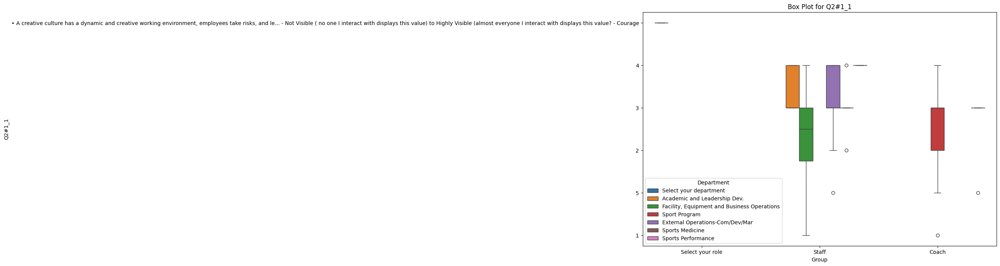

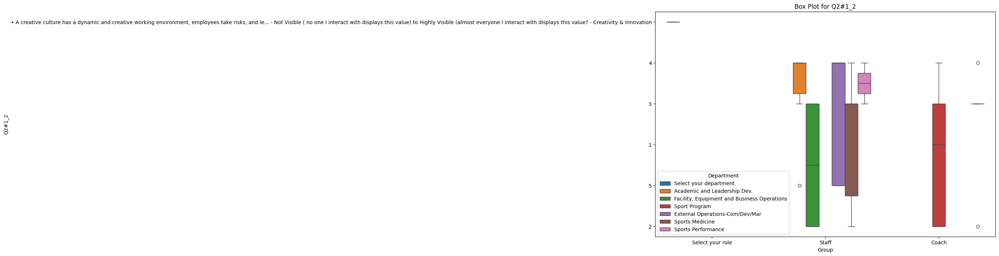

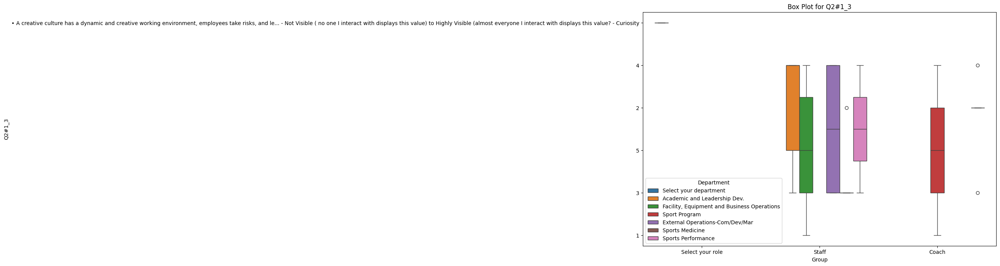

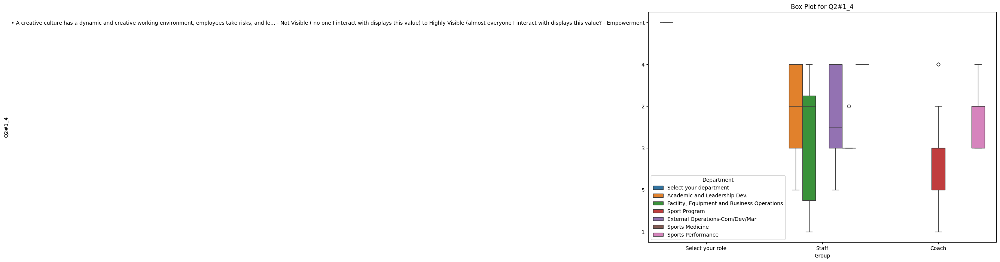

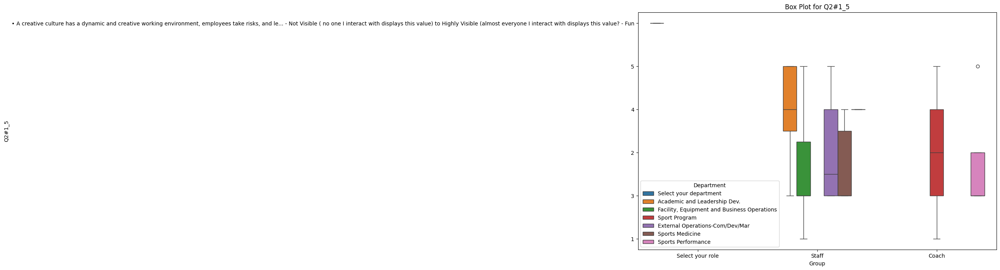

...

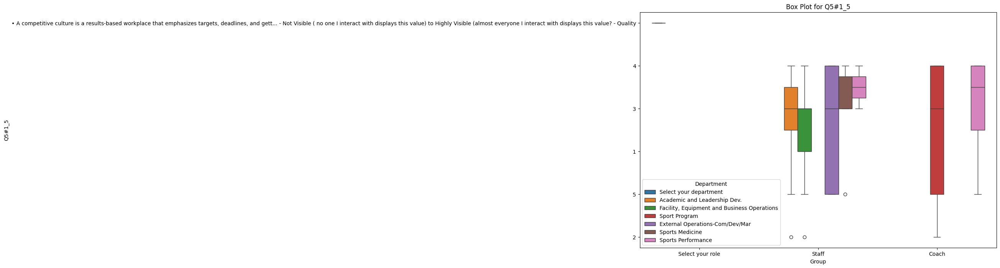

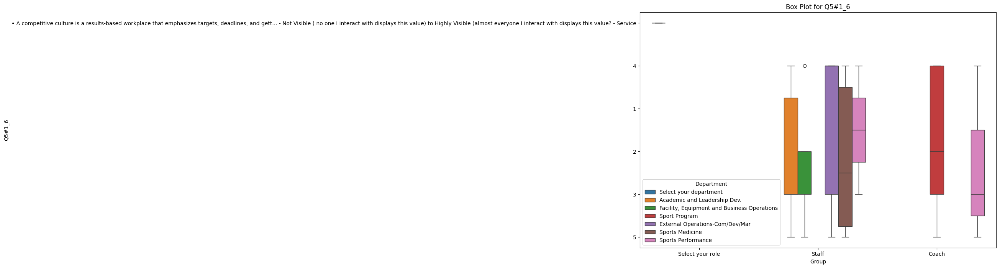

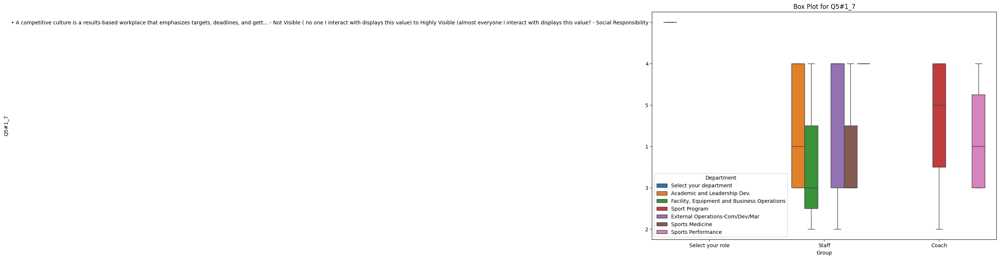

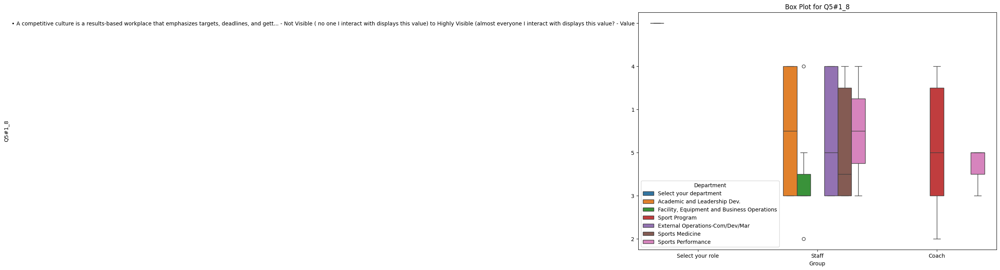

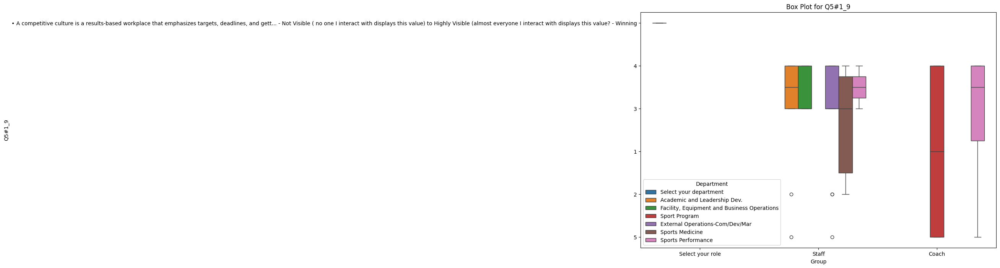

In [ ]:
# Box plots
# for col in questions_cols:
#     plt.figure(figsize=(12, 8))  # The box plots were too small so I added this to adjust width and height as needed
#     sns.boxplot(x='Group', y=col, hue='Department', data=data)
#     plt.title(f'Box Plot for {col}')
#     plt.show()

Bar Charts

Here the bar charts show the mean response by each coach and staff and color coded by department.

In [ ]:
# here is where I noticed that the coaches are only in 2 departments while the staff are in all.

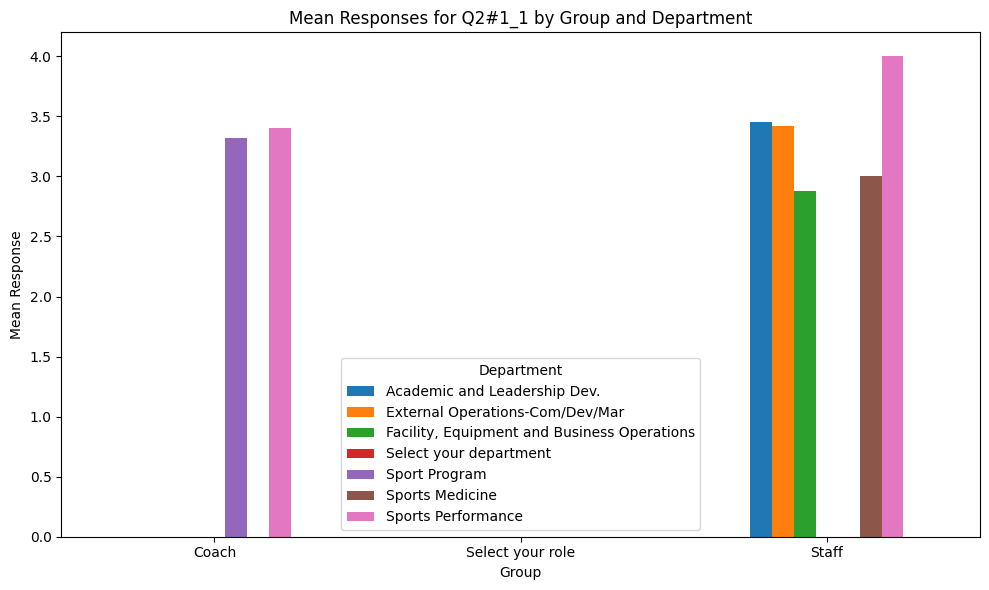

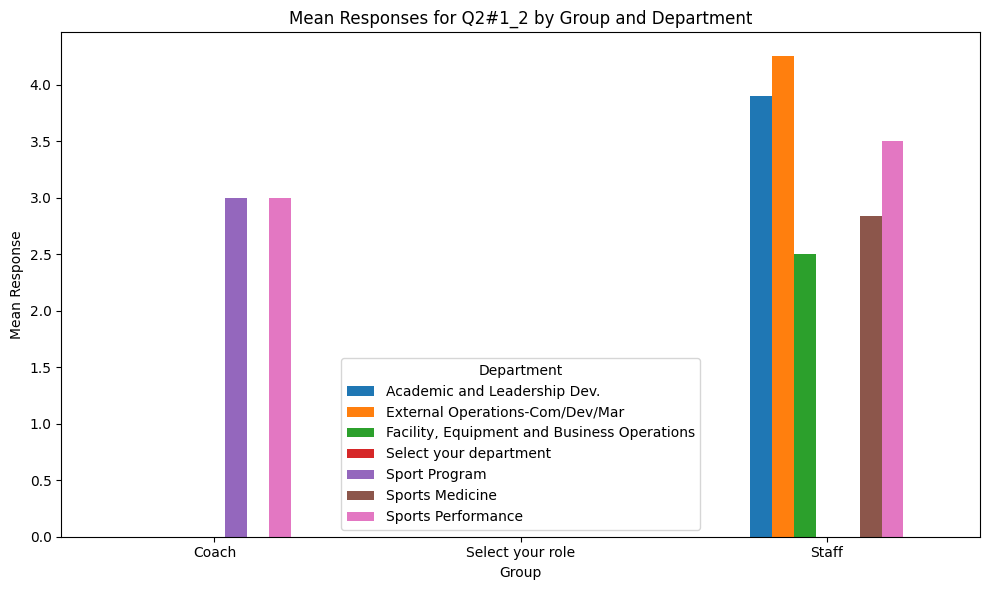

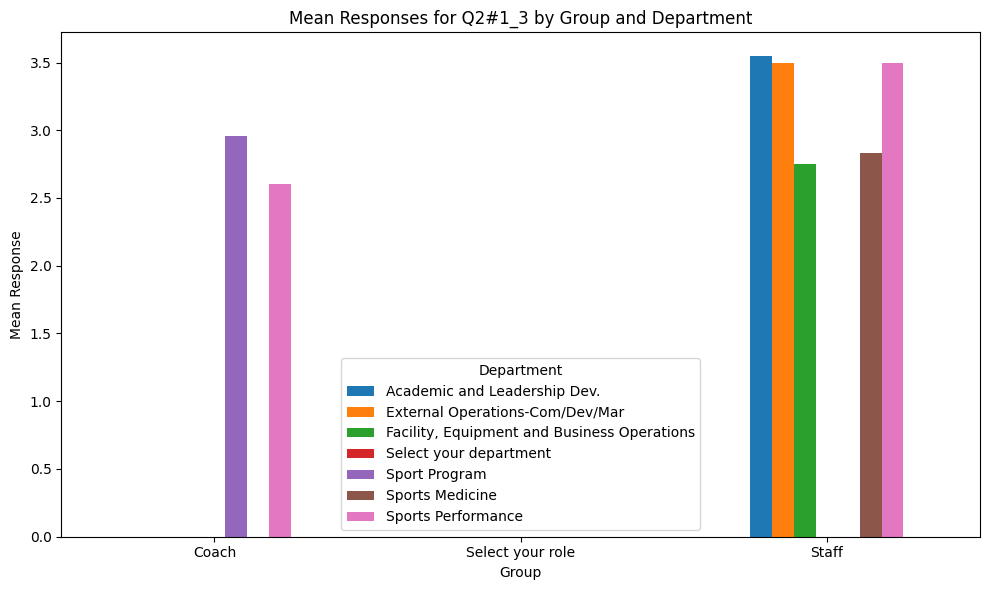

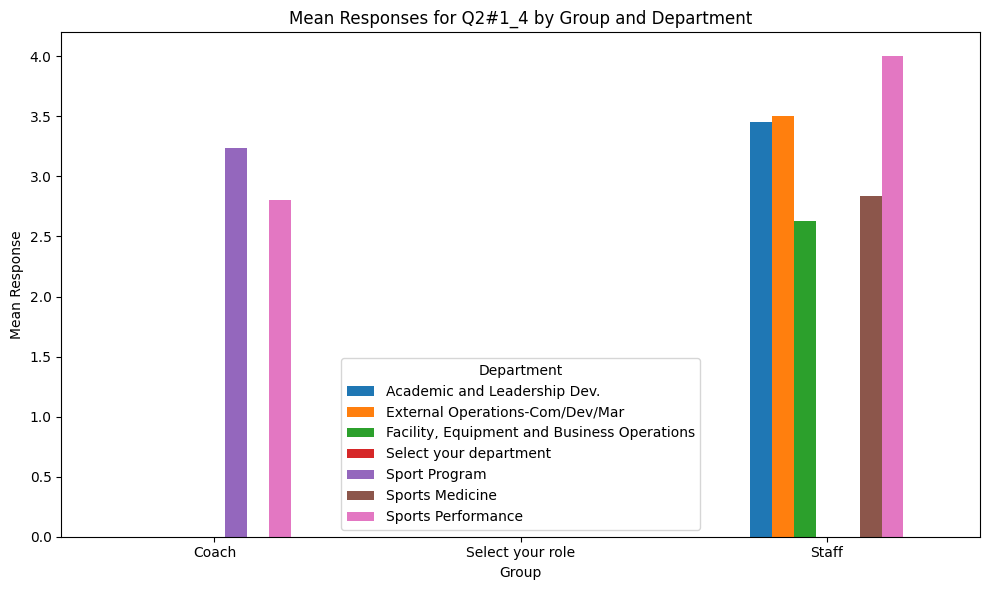

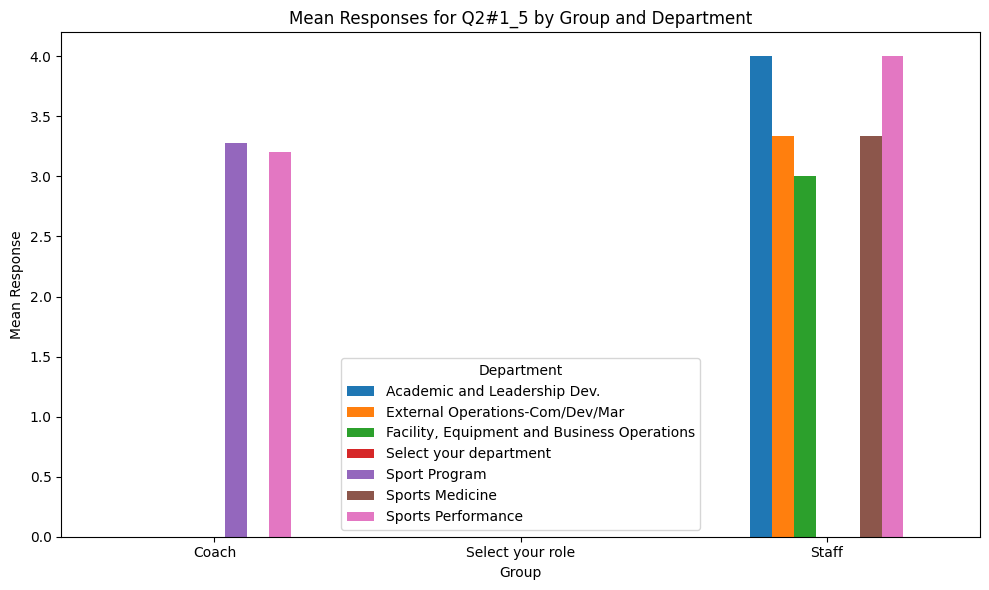

...

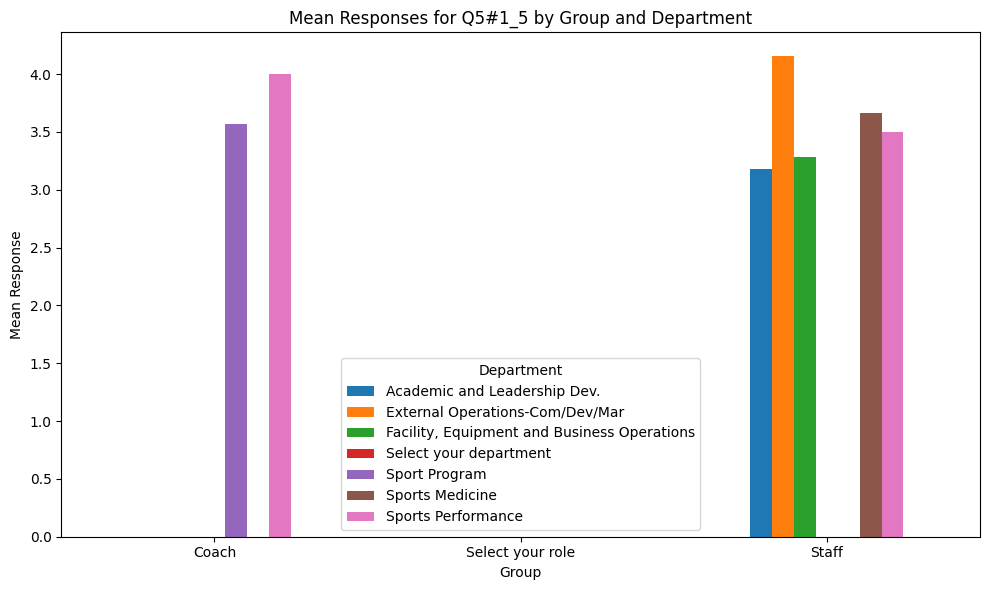

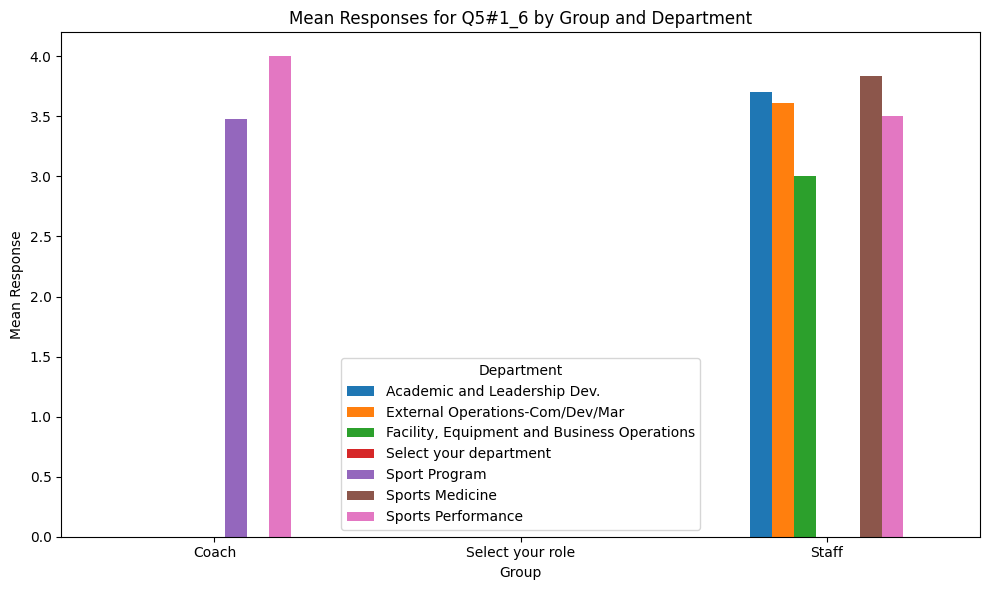

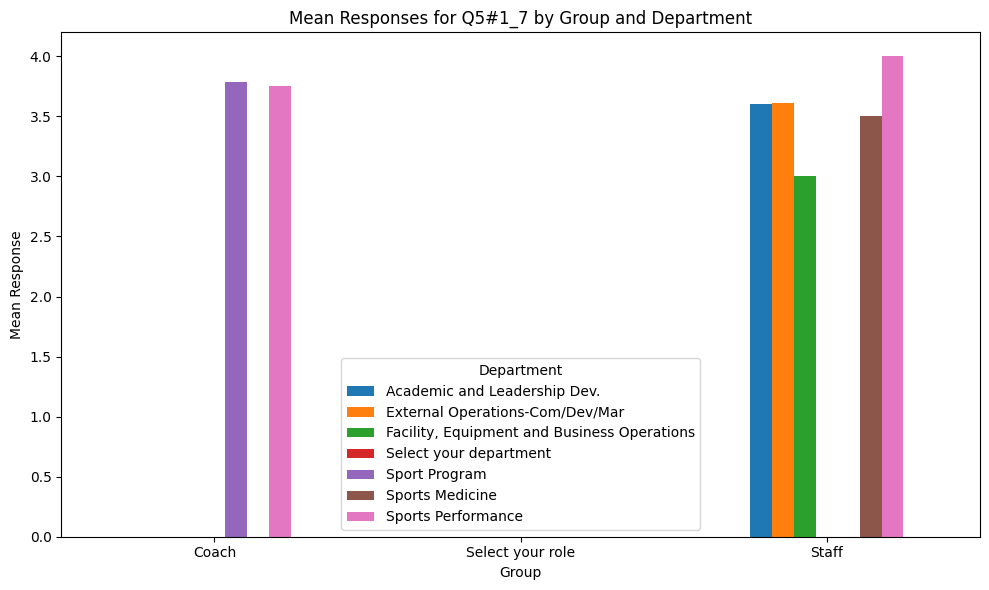

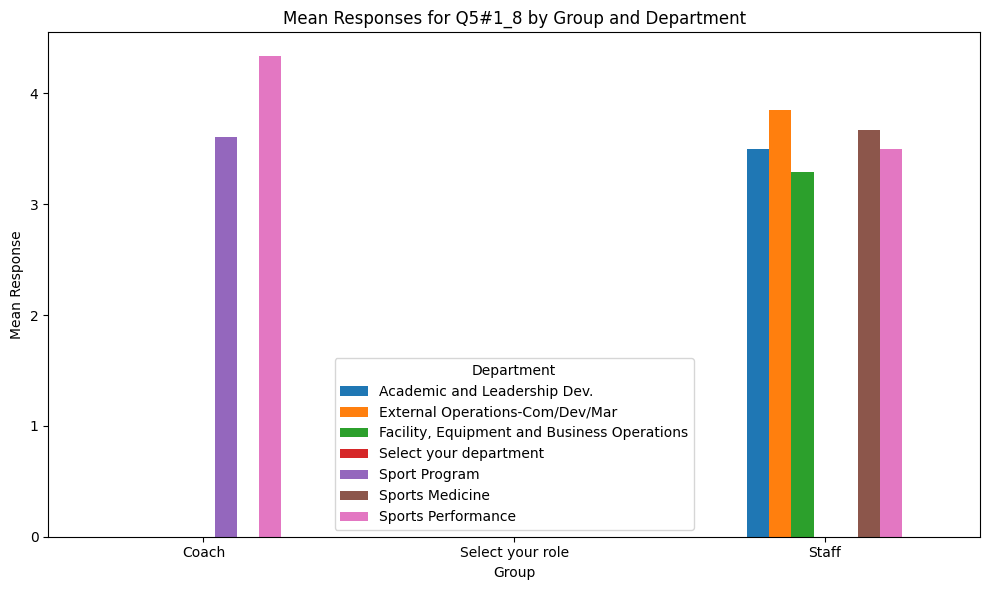

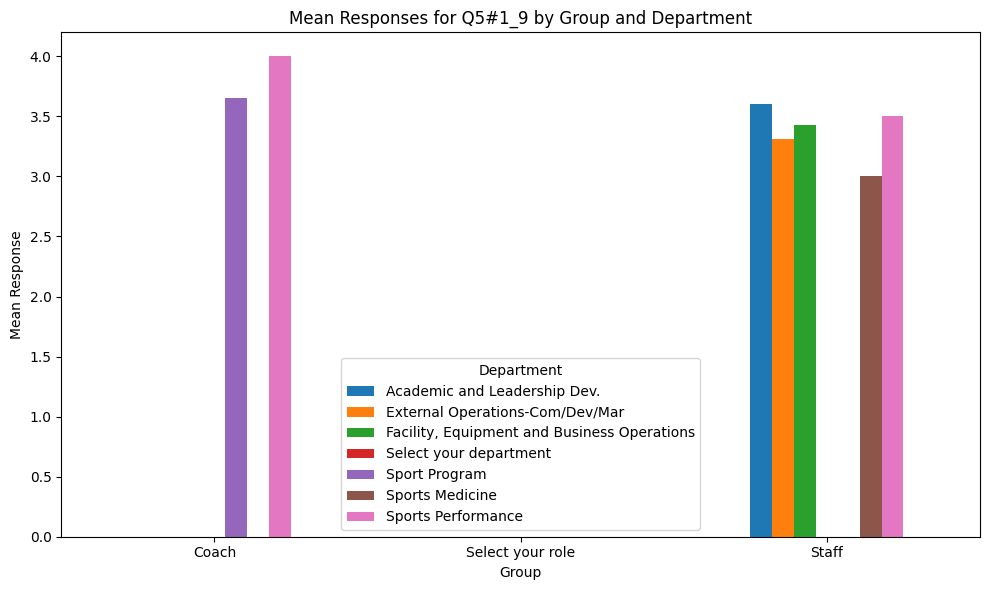

In [ ]:
# Bar Charts for Mean Responses
for col in questions_cols:
  # Convert the column to numeric type, coercing errors to NaN
  data[col] = pd.to_numeric(data[col], errors='coerce')

  # Group data by 'Group' and 'Department', and calculate mean for each group
  grouped_data = data.groupby(['Group', 'Department'])[col].mean().unstack()

  # Plot the bar chart
  grouped_data.plot(kind='bar', figsize=(10, 6))
  plt.title(f'Mean Responses for {col} by Group and Department')
  plt.xlabel('Group')
  plt.ylabel('Mean Response')
  plt.xticks(rotation=0)
  plt.legend(title='Department')
  plt.tight_layout()
  plt.show()

In [ ]:
# Chi-Square test
chi_square_results = {}
for col in questions_cols:
    chi_square_results[col] = {}
    for dept in data['Department'].unique():
        contingency_table = pd.crosstab(data[data['Department'] == dept]['Group'], data[data['Department'] == dept][col])
        # Check if contingency table has data before performing chi-squared test
        if contingency_table.size > 0:
          chi2, p, dof, expected = chi2_contingency(contingency_table)
          chi_square_results[col][dept] = {'chi2': chi2, 'p-value': p, 'dof': dof}

In [ ]:
# now this will show me the output of the chi test from the prvious cell

# Print Chi-Square Results
for question, dept_results in chi_square_results.items():
    print(f"Chi-Square Results for {question}:")
    for dept, results in dept_results.items():
        print(f"  Department: {dept}")
        print(f"    Chi-square statistic: {results['chi2']}")
        print(f"    P-value: {results['p-value']}")
        print(f"    Degrees of freedom: {results['dof']}")


Chi-Square Results for Q2#1_1:
  Department: Academic and Leadership Dev.
    Chi-square statistic: 0.0
    P-value: 1.0
    Degrees of freedom: 0
  Department: Facility, Equipment and Business Operations
    Chi-square statistic: 0.0
    P-value: 1.0
    Degrees of freedom: 0
  Department: Sport Program
    Chi-square statistic: 0.0
    P-value: 1.0
    Degrees of freedom: 0
  Department: External Operations-Com/Dev/Mar
    Chi-square statistic: 0.0
    P-value: 1.0
    Degrees of freedom: 0
  Department: Sports Medicine
    Chi-square statistic: 0.0
    P-value: 1.0
    Degrees of freedom: 0
  Department: Sports Performance
    Chi-square statistic: 7.0
    P-value: 0.0301973834223185
    Degrees of freedom: 2
Chi-Square Results for Q2#1_2:
  Department: Academic and Leadership Dev.
    Chi-square statistic: 0.0
    P-value: 1.0
    Degrees of freedom: 0
  Department: Facility, Equipment and Business Operations
    Chi-square statistic: 0.0
    P-value: 1.0
    Degrees of freedom: 0


In [ ]:

# Reshape the data into long format
melted_data = data.melt(id_vars=['Group', 'Department'], var_name='Question', value_name='Response')

# Create a frequency table by grouping and counting
frequency_table = melted_data.groupby(['Group', 'Question', 'Response']).size().reset_index(name='Count')

# Pivot the table for better visualization
pivot_table = frequency_table.pivot_table(index=['Question', 'Response'], columns='Group', values='Count', fill_value=0)

print(pivot_table)

Group                                                        Coach  \
Question Response                                                    
Q10.1    1. Alignment, (define success etc so people kno...    0.0   
         1. Trust 2. Work ethic 3. Risk taking 4. Winnin...    1.0   
         Accountability, Excellence, Communication, Team...    0.0   
         Accountability, driven, growth mindset, innovat...    0.0   
         Accountability, teamwork, reality, growth, comm...    0.0   
...                                                            ...   
Q8       erratic                                               0.0   
         high work ethic, quality of care, team oriented       0.0   
         inconsistent                                          1.0   
         just do enough to get by                              1.0   
         ongoing professional development built on trans...    0.0   

Group                                                        Select your role  \
Question

-----

In [ ]:
frequency_distribution = {}
for col in questions_cols:
    frequency_distribution[col] = {}
    for dept in data['Department'].unique():
        coaches_dept_data = coaches_data[coaches_data['Department'] == dept][col]
        staff_dept_data = staff_data[staff_data['Department'] == dept][col]
        frequency_distribution[col][dept] = {
            'Coach': coaches_dept_data.value_counts(normalize=True).sort_index(),
            'Staff': staff_dept_data.value_counts(normalize=True).sort_index()
        }

<ipython-input-60-4f751eb224db>:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=plotting_df, x='Response', y='Proportion', hue='Group', ci=None, palette={'Coach': 'blue', 'Staff': 'red'})


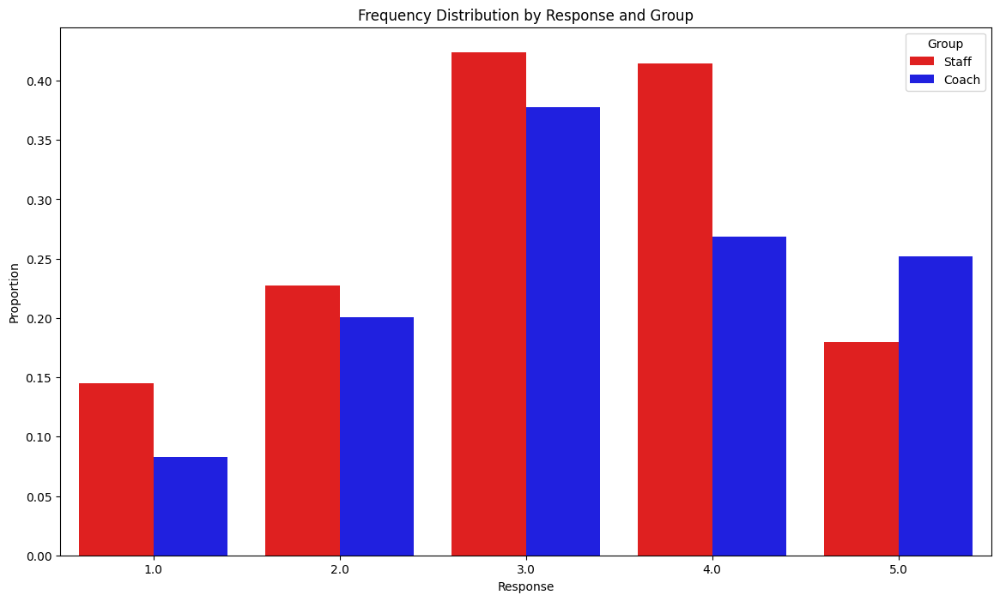

In [ ]:
data_for_plotting = []

for col in frequency_distribution:
    for dept in frequency_distribution[col]:
        for group in frequency_distribution[col][dept]:
            freq_df = frequency_distribution[col][dept][group].reset_index()
            freq_df.columns = ['Response', 'Proportion']
            freq_df['Department'] = dept
            freq_df['Group'] = group
            freq_df['Question'] = col
            data_for_plotting.append(freq_df)

# Combine all data into a single DataFrame
plotting_df = pd.concat(data_for_plotting, ignore_index=True)

# Plot with seaborn
import seaborn as sns

plt.figure(figsize=(14, 8))
sns.barplot(data=plotting_df, x='Response', y='Proportion', hue='Group', ci=None, palette={'Coach': 'blue', 'Staff': 'red'})
plt.title('Frequency Distribution by Response and Group')
plt.xlabel('Response')
plt.ylabel('Proportion')
plt.legend(title='Group')
plt.show()

In [ ]:
pivot_table = plotting_df.pivot_table(
    index='Response',    # Rows
    columns=['Group', 'Department'],  # Columns
    values='Proportion', # Values to aggregate
    fill_value=0,        # Fill missing values with 0
    aggfunc='mean'       # Aggregation function
)

# Display the pivot table
print(pivot_table)

Group              Coach                                           Staff  \
Department Sport Program Sports Performance Academic and Leadership Dev.   
Response                                                                   
1.0             0.078327           0.250000                     0.090909   
2.0             0.153164           0.315625                     0.156566   
3.0             0.332054           0.429048                     0.405909   
4.0             0.213074           0.342778                     0.403828   
5.0             0.237000           0.268571                     0.174308   

Group                                       \
Department External Operations-Com/Dev/Mar   
Response                                     
1.0                               0.106838   
2.0                               0.114196   
3.0                               0.340836   
4.0                               0.398951   
5.0                               0.195489   

Group                 

<ipython-input-62-ed7a90cdb3d3>:9: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=melted_pivot, x='Response', y='Proportion', hue='Group', ci=None)


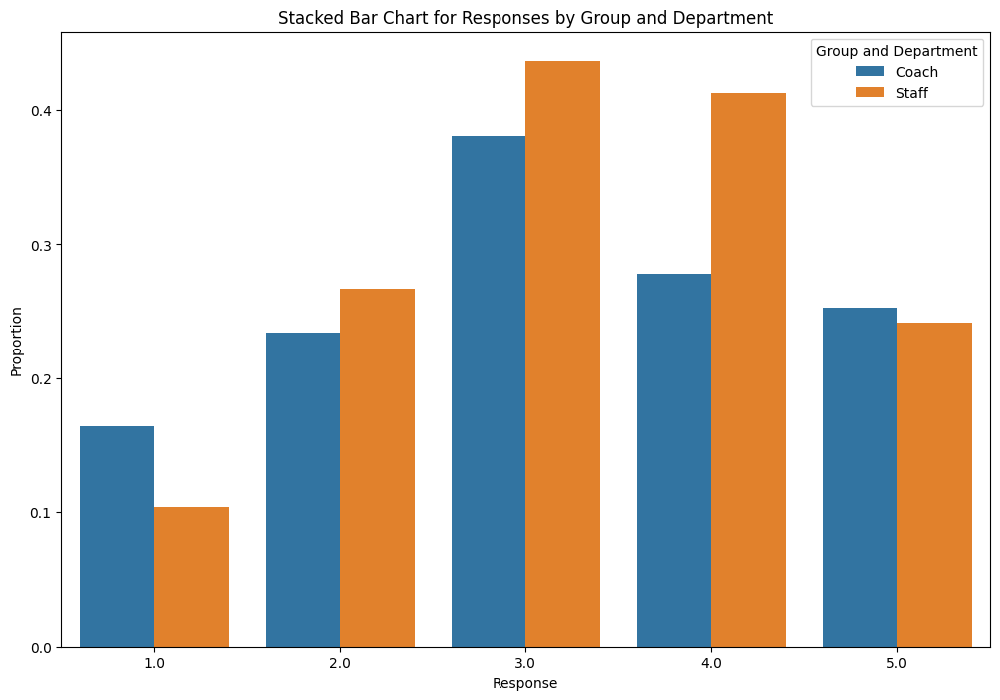

In [ ]:

# Reset the index of the pivot table to plot
pivot_table_reset = pivot_table.reset_index()

# Melt the DataFrame for better plotting
melted_pivot = pd.melt(pivot_table_reset, id_vars=['Response'], var_name=['Group', 'Department'], value_name='Proportion')

# Plot using seaborn
plt.figure(figsize=(12, 8))
sns.barplot(data=melted_pivot, x='Response', y='Proportion', hue='Group', ci=None)
plt.title('Stacked Bar Chart for Responses by Group and Department')
plt.xlabel('Response')
plt.ylabel('Proportion')
plt.legend(title='Group and Department', loc='upper right')
plt.show()

In [ ]:

# Function to plot stacked bar chart
def plot_stacked_bar(df, question, dept):
    # Filter data for specific question and department
    df_filtered = df[(df['Question'] == question) & (df['Department'] == dept)]

    # Pivot the data to get the proportions for each group
    pivot_df = df_filtered.pivot_table(index='Response', columns='Group', values='Proportion', fill_value=0)

    # Plotting
    pivot_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=['blue', 'red'])

    # Add titles and labels
    plt.title(f'Stacked Bar Chart for {question} in {dept}')
    plt.xlabel('Response')
    plt.ylabel('Proportion')
    plt.legend(title='Group')
    plt.show()

In [ ]:
# Create a pivot table
pivot_table = plotting_df.pivot_table(
    index='Response',    # Rows
    columns=['Group', 'Department'],  # Columns
    values='Proportion', # Values to aggregate
    fill_value=0,        # Fill missing values with 0
    aggfunc='mean'       # Aggregation function
)

# Display the pivot table
print(pivot_table)

Group              Coach                                           Staff  \
Department Sport Program Sports Performance Academic and Leadership Dev.   
Response                                                                   
1.0             0.078327           0.250000                     0.090909   
2.0             0.153164           0.315625                     0.156566   
3.0             0.332054           0.429048                     0.405909   
4.0             0.213074           0.342778                     0.403828   
5.0             0.237000           0.268571                     0.174308   

Group                                       \
Department External Operations-Com/Dev/Mar   
Response                                     
1.0                               0.106838   
2.0                               0.114196   
3.0                               0.340836   
4.0                               0.398951   
5.0                               0.195489   

Group                 

<ipython-input-26-ed7a90cdb3d3>:9: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=melted_pivot, x='Response', y='Proportion', hue='Group', ci=None)


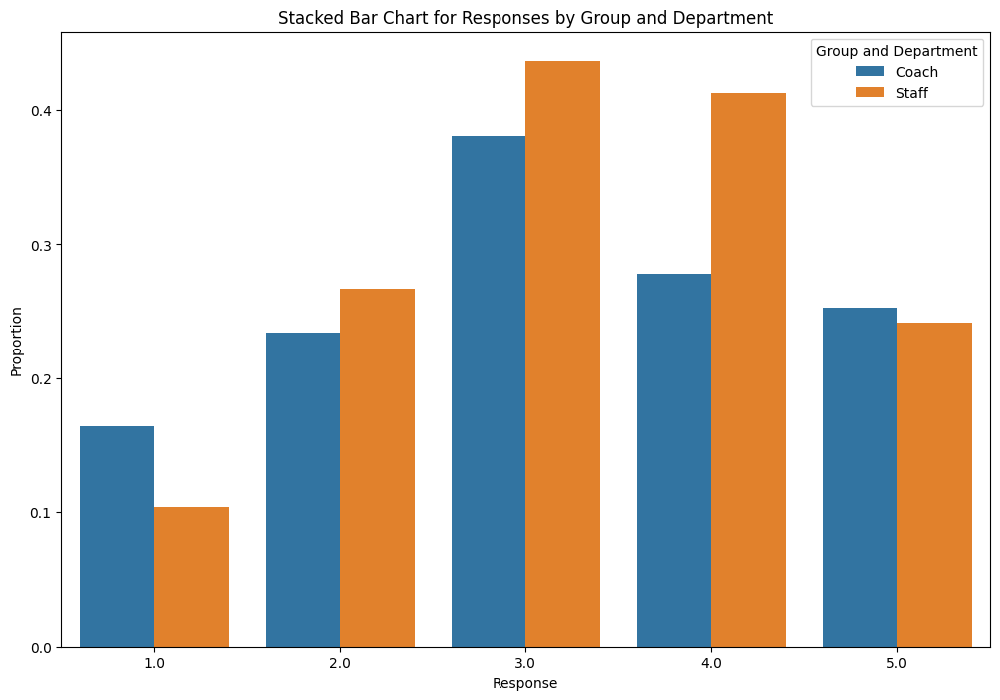

In [ ]:
# Reset the index of the pivot table to plot
pivot_table_reset = pivot_table.reset_index()

# Melt the DataFrame for better plotting
melted_pivot = pd.melt(pivot_table_reset, id_vars=['Response'], var_name=['Group', 'Department'], value_name='Proportion')

# Plot using seaborn
plt.figure(figsize=(12, 8))
sns.barplot(data=melted_pivot, x='Response', y='Proportion', hue='Group', ci=None)
plt.title('Stacked Bar Chart for Responses by Group and Department')
plt.xlabel('Response')
plt.ylabel('Proportion')
plt.legend(title='Group and Department', loc='upper right')
plt.show()

So I believe this code is creating charts for each question and creating a chart for every department and the role that participant had in answering the question.

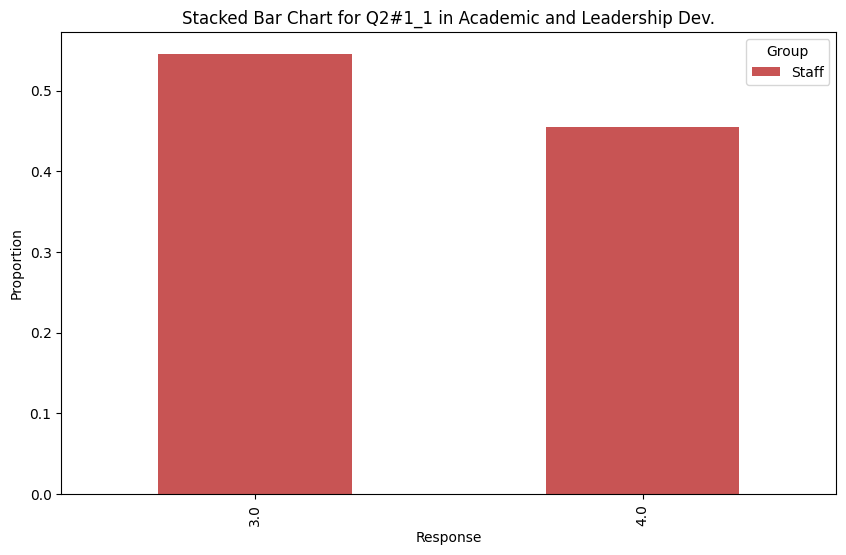

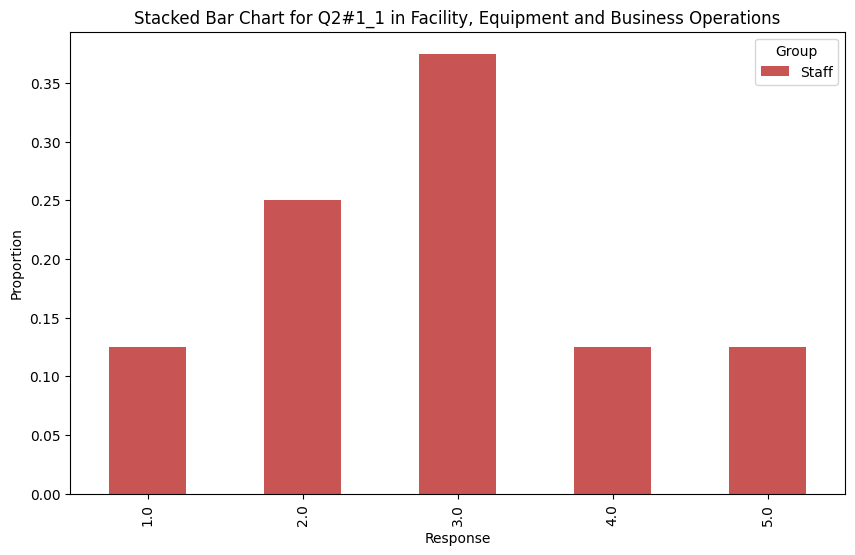

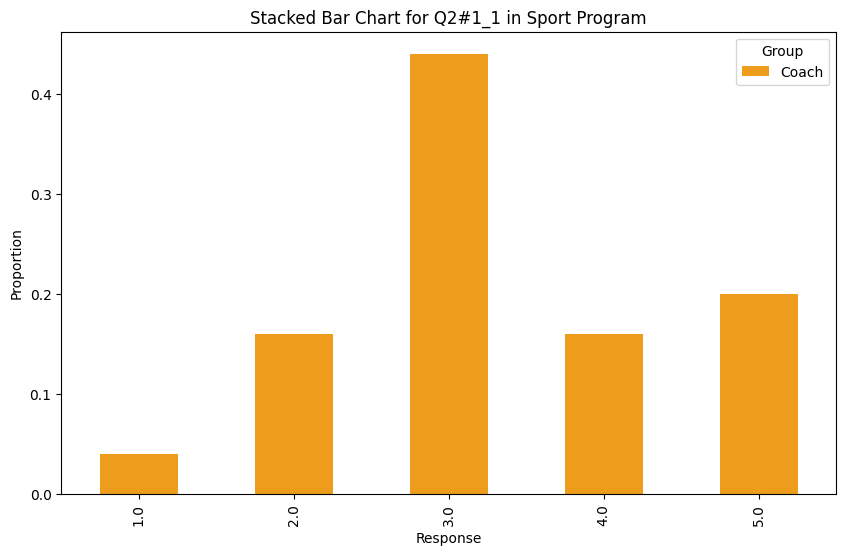

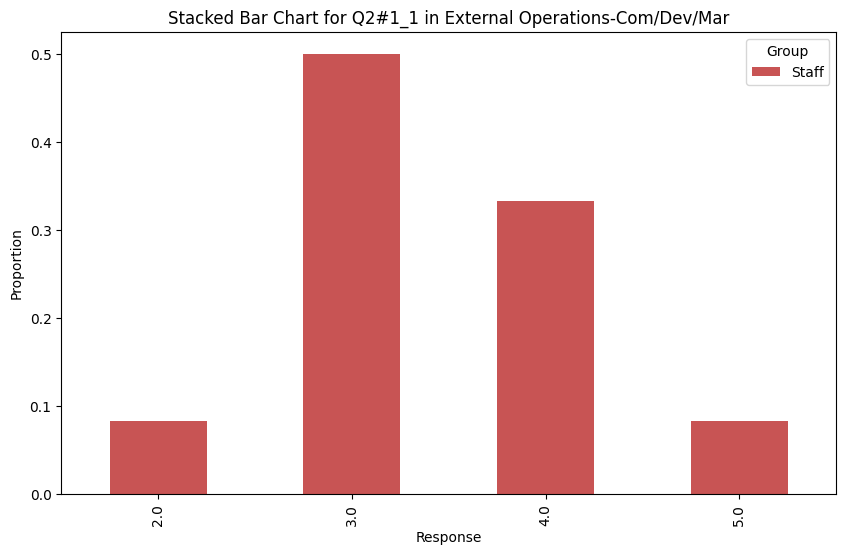

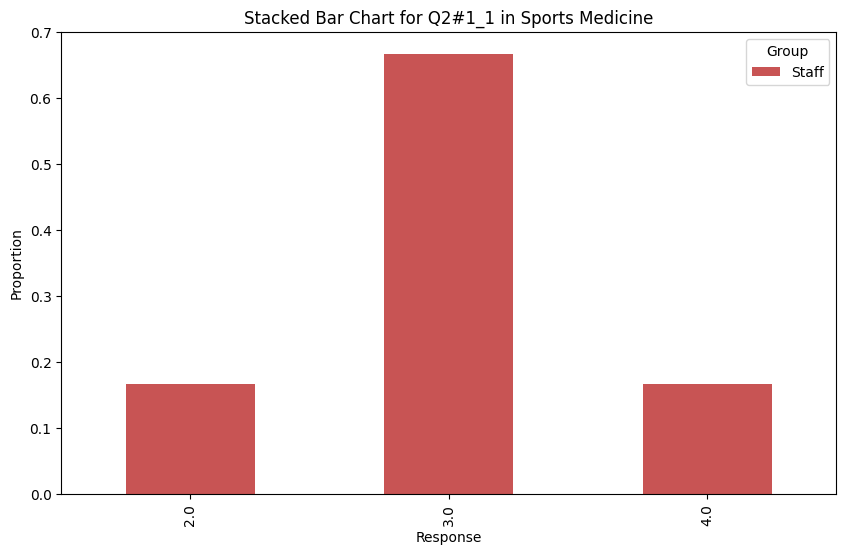

...

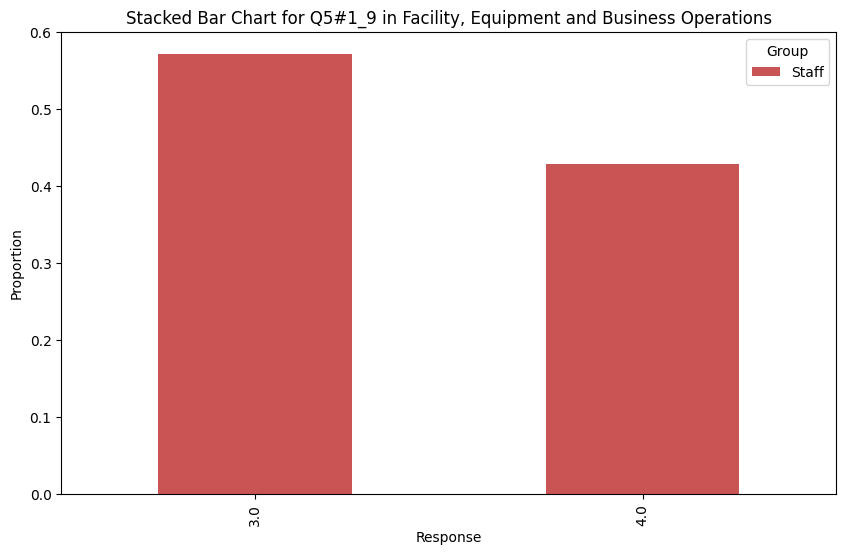

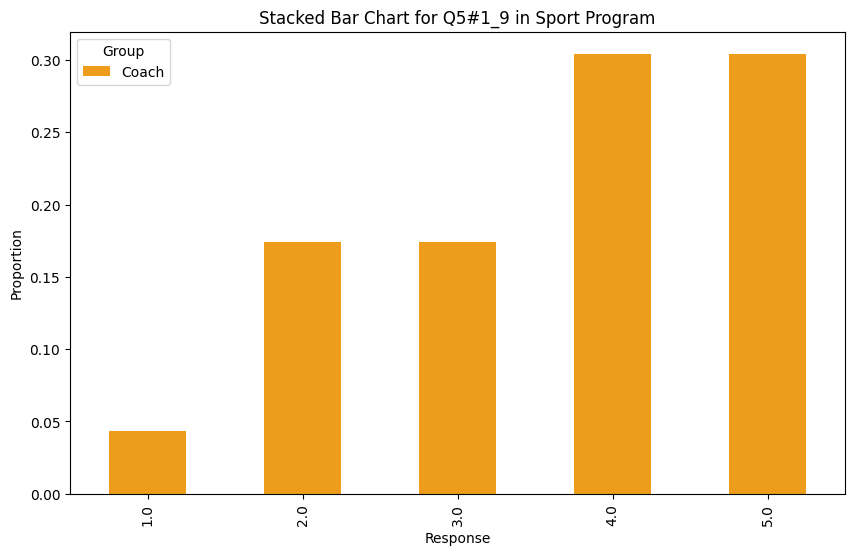

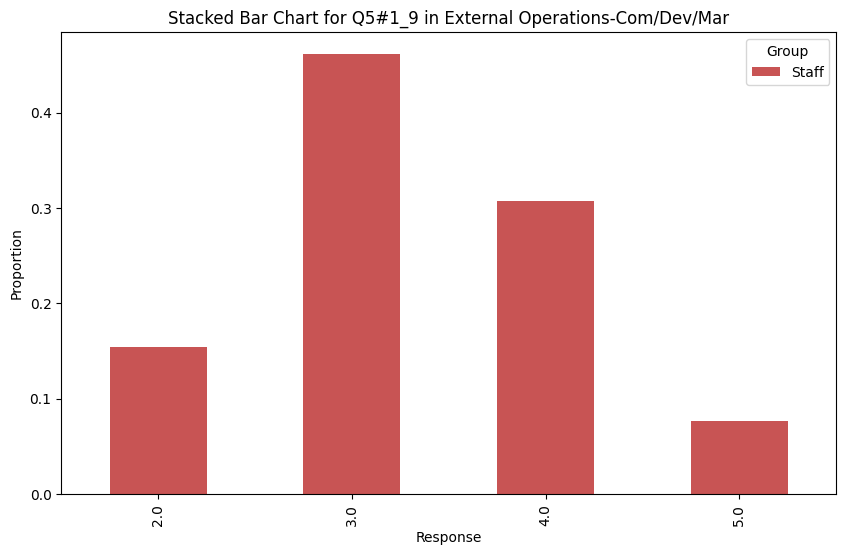

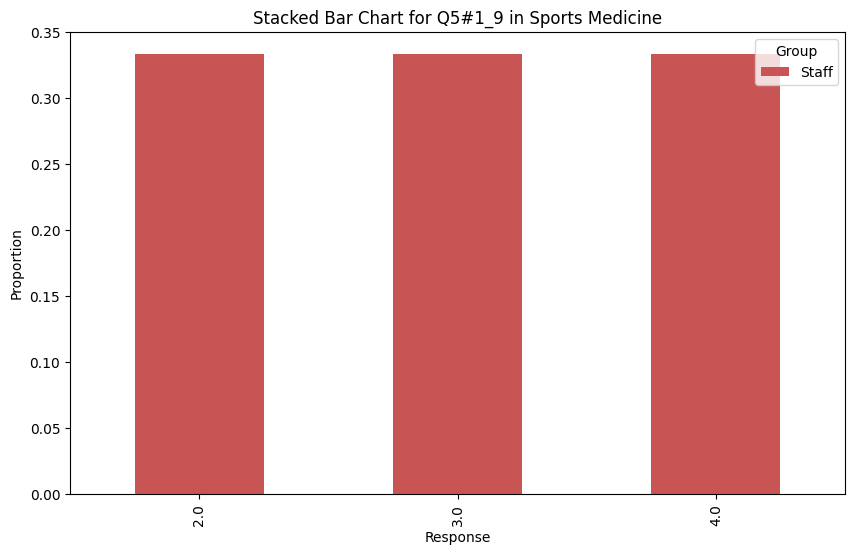

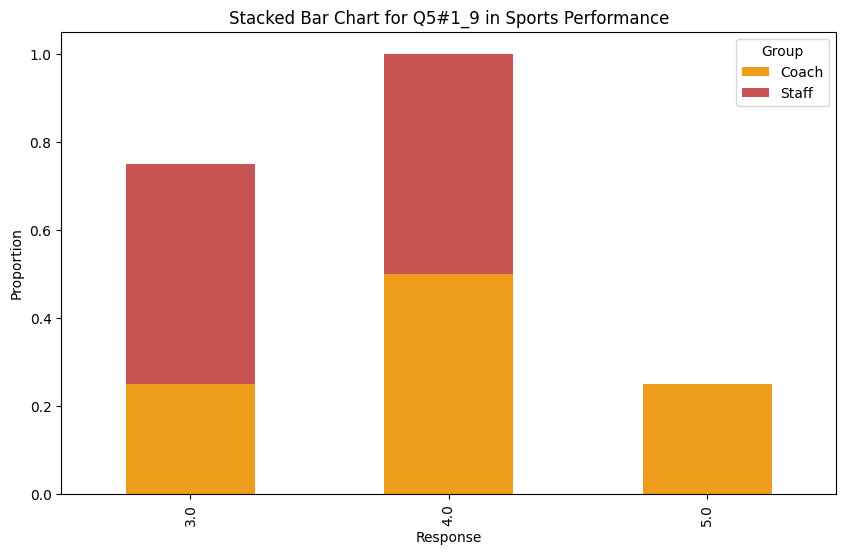

In [ ]:
data_for_plotting = []

for col in frequency_distribution:
    for dept in frequency_distribution[col]:
        for group in frequency_distribution[col][dept]:
            freq_df = frequency_distribution[col][dept][group].reset_index()
            freq_df.columns = ['Response', 'Proportion']
            freq_df['Department'] = dept
            freq_df['Group'] = group
            freq_df['Question'] = col
            data_for_plotting.append(freq_df)

# Combine all data into a single DataFrame
plotting_df = pd.concat(data_for_plotting, ignore_index=True)

# Function to plot stacked bar chart
def plot_stacked_bar(df, question, dept):
    # Filter data for specific question and department
    df_filtered = df[(df['Question'] == question) & (df['Department'] == dept)]

    # Pivot the data to get the proportions for each group
    pivot_df = df_filtered.pivot_table(index='Response', columns='Group', values='Proportion', fill_value=0)

    # Define your custom colors
    color_dict = {'Coach': '#ee9c1b', 'Staff': '#c85454'}

    # Plotting
    pivot_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=[color_dict[group] for group in pivot_df.columns])

    # Add titles and labels
    plt.title(f'Stacked Bar Chart for {question} in {dept}')
    plt.xlabel('Response')
    plt.ylabel('Proportion')
    plt.legend(title='Group')
    plt.show()

# Plot for each question and department
for question in plotting_df['Question'].unique():
    for dept in plotting_df['Department'].unique():
        plot_stacked_bar(plotting_df, question, dept)

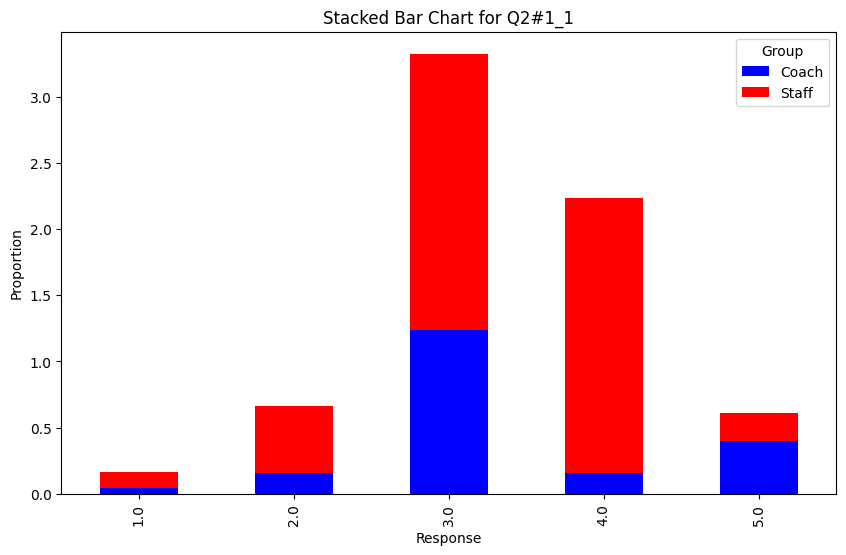

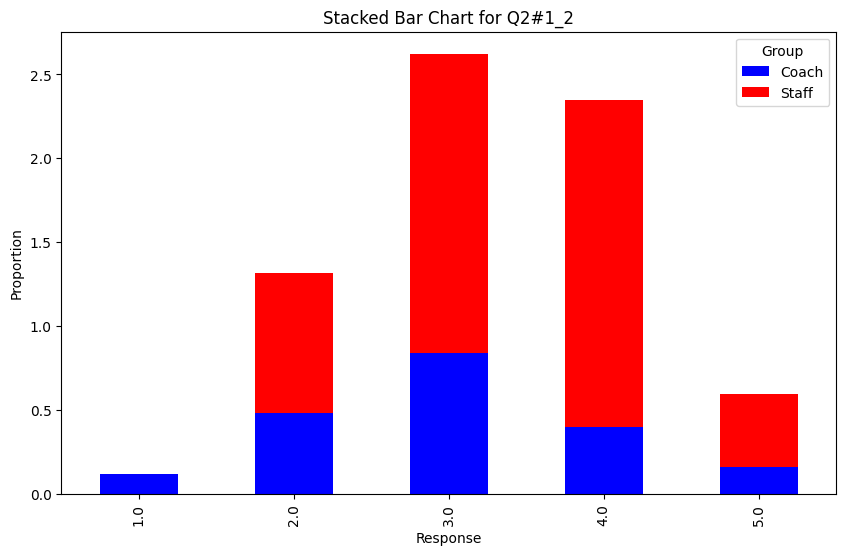

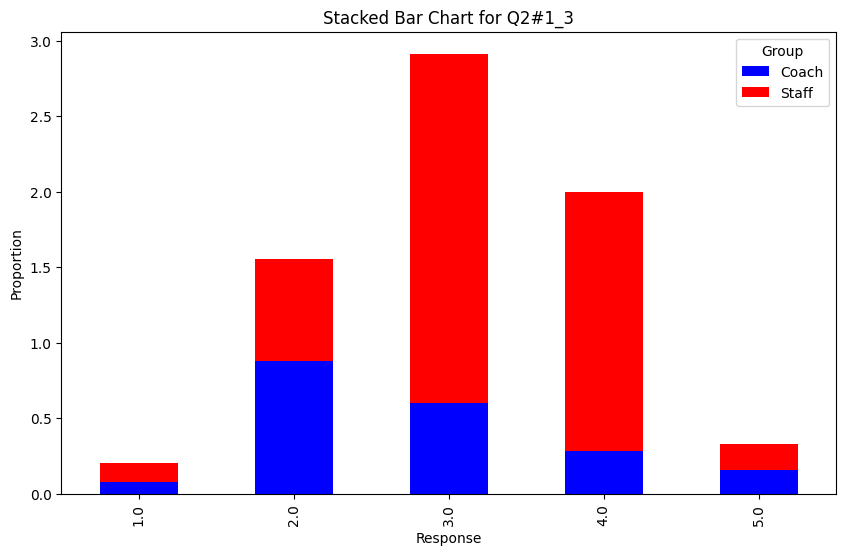

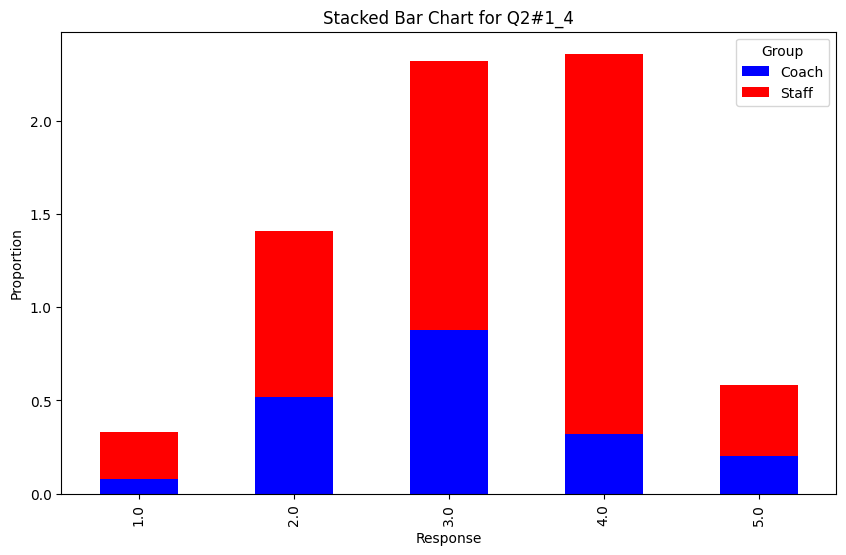

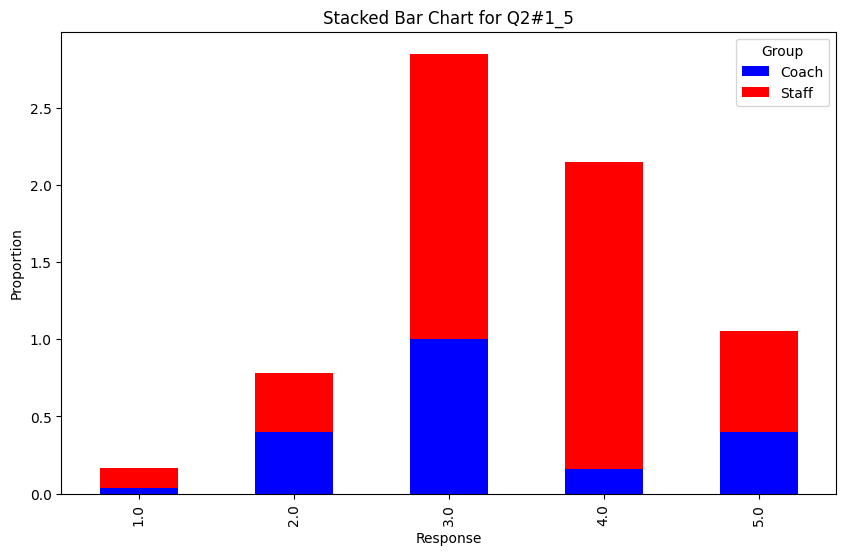

...

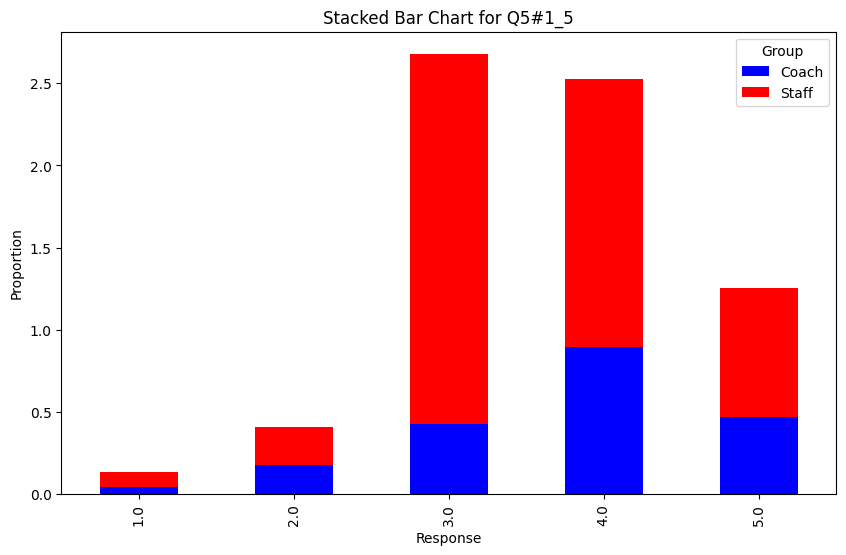

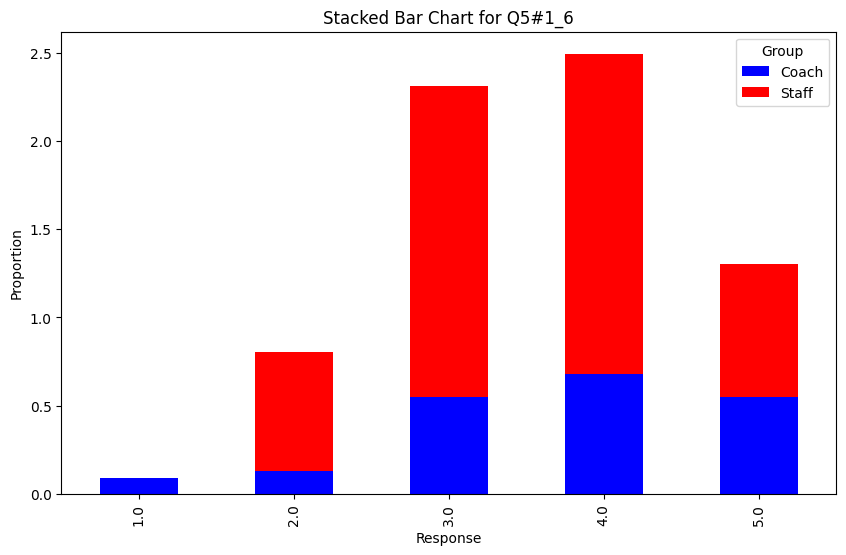

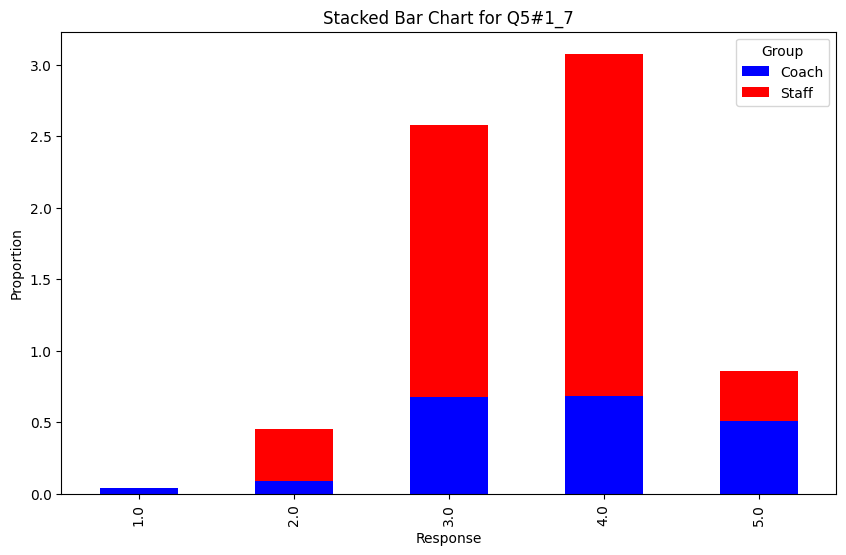

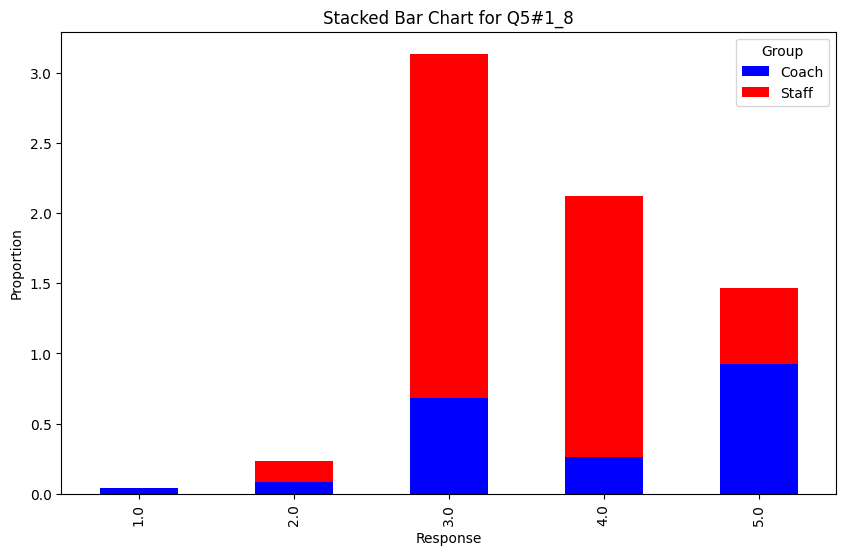

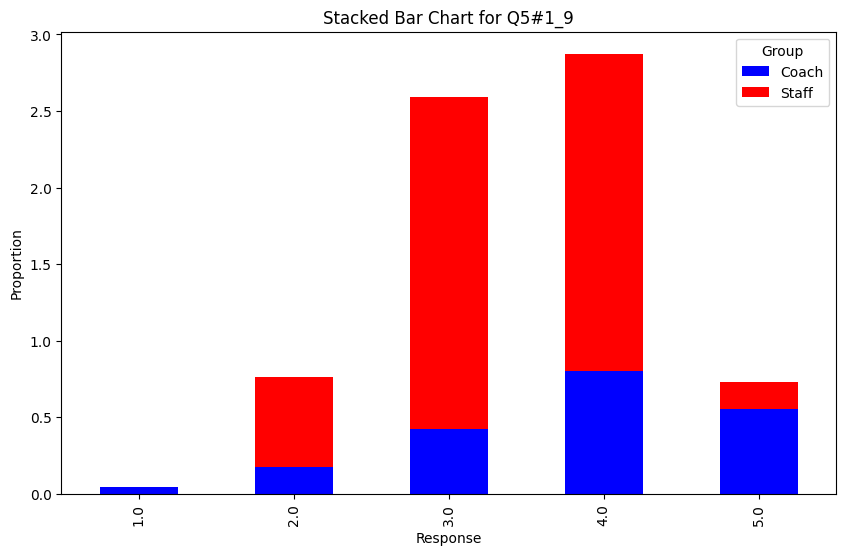

In [67]:
# Aggregate the data across departments
aggregated_data = []

for col in frequency_distribution:
    for group in ['Coach', 'Staff']:
        all_depts_data = pd.DataFrame()
        for dept in frequency_distribution[col]:
            dept_data = frequency_distribution[col][dept][group].reset_index()
            all_depts_data = pd.concat([all_depts_data, dept_data], ignore_index=True)

        # Sum the proportions for each response, grouping by the first column (assumed to be 'Response')
        summed_data = all_depts_data.groupby(all_depts_data.columns[0]).sum().reset_index()  # Group by the first column instead of 'index'
        summed_data.columns = ['Response', 'Proportion']
        summed_data['Group'] = group
        summed_data['Question'] = col
        aggregated_data.append(summed_data)

# Combine all aggregated data into a single DataFrame
plotting_df = pd.concat(aggregated_data, ignore_index=True)

# Function to plot stacked bar chart
def plot_stacked_bar(df, question):
    # Filter data for specific question
    df_filtered = df[df['Question'] == question]

    # Pivot the data to get the proportions for each group
    pivot_df = df_filtered.pivot_table(index='Response', columns='Group', values='Proportion', fill_value=0)

    # Plotting
    pivot_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=['blue', 'red'])

    # Add titles and labels
    plt.title(f'Stacked Bar Chart for {question}')
    plt.xlabel('Response')
    plt.ylabel('Proportion')
    plt.legend(title='Group')
    plt.show()

# Plot for each question
for question in plotting_df['Question'].unique():
    plot_stacked_bar(plotting_df, question)

In [68]:
for col in frequency_distribution:
    for group in ['Coach', 'Staff']:
        all_depts_data = pd.DataFrame()
        for dept in frequency_distribution[col]:
            dept_data = frequency_distribution[col][dept][group].reset_index()
            all_depts_data = pd.concat([all_depts_data, dept_data], ignore_index=True)

        # Sum the proportions for each response, grouping by the first column (assumed to be 'Response')
        summed_data = all_depts_data.groupby(all_depts_data.columns[0]).sum().reset_index()  # Group by the first column instead of 'index'
        summed_data.columns = ['Response', 'Proportion']
        summed_data['Group'] = group
        summed_data['Question'] = col
        aggregated_data.append(summed_data)

# Combine all aggregated data into a single DataFrame
plotting_df = pd.concat(aggregated_data, ignore_index=True)

# Print the pivot tables
def print_pivot_table(df, question):
    # Filter data for specific question
    df_filtered = df[df['Question'] == question]

    # Pivot the data to get the proportions for each group
    pivot_df = df_filtered.pivot_table(index='Response', columns='Group', values='Proportion', fill_value=0)

    # Print the pivot table
    print(f"Pivot Table for {question}:\n", pivot_df)
    print("\n")

# Print pivot tables for each question
for question in plotting_df['Question'].unique():
    print_pivot_table(plotting_df, question)

Pivot Table for Q2#1_1:
 Group     Coach     Staff
Response                 
1.0        0.04  0.125000
2.0        0.16  0.500000
3.0        1.24  2.087121
4.0        0.16  2.079545
5.0        0.40  0.208333


Pivot Table for Q2#1_2:
 Group     Coach     Staff
Response                 
1.0        0.12  0.000000
2.0        0.48  0.833333
3.0        0.84  1.783333
4.0        0.40  1.950000
5.0        0.16  0.433333


Pivot Table for Q2#1_3:
 Group     Coach     Staff
Response                 
1.0        0.08  0.125000
2.0        0.88  0.674242
3.0        0.60  2.314394
4.0        0.28  1.719697
5.0        0.16  0.166667


Pivot Table for Q2#1_4:
 Group     Coach     Staff
Response                 
1.0        0.08  0.250000
2.0        0.52  0.890152
3.0        0.88  1.439394
4.0        0.32  2.037879
5.0        0.20  0.382576


Pivot Table for Q2#1_5:
 Group     Coach     Staff
Response                 
1.0        0.04  0.125000
2.0        0.40  0.382576
3.0        1.00  1.848485
4.0      

So here I created a new pivot table that ensures that the proportions for each group (Coach and Staff) sum to 100%. I was running into the issue where the pivot tables and charts i was creating were adding up to be more than 100% reponse rate, it was closer to 200%. This was becuase when I was summing the proportions across departments, I was effectively double-counting the respondents. Each department's proportions are already relative to their specific department's total responses. When I aggregated these without adjusting for the total number of responses across all departments, I ended up with proportions that exceed 100%.

To fix this I re-calculated the proportions based on the total number of responses across all departments for each group.

Pivot Table for Q2#1_1 (in percentages):
 Group         Coach      Staff
Response                      
1.0        2.857143   4.166667
2.0       11.428571  13.888889
3.0       54.285714  46.439394
4.0       11.428571  29.116162
5.0       20.000000   6.388889


Pivot Table for Q2#1_2 (in percentages):
 Group     Coach      Staff
Response                  
1.0         7.5   0.000000
2.0        25.0  15.384615
3.0        37.5  33.461538
4.0        20.0  41.153846
5.0        10.0  10.000000


Pivot Table for Q2#1_3 (in percentages):
 Group     Coach      Staff
Response                  
1.0         5.0   3.333333
2.0        40.0  15.151515
3.0        32.5  42.121212
4.0        12.5  34.949495
5.0        10.0   4.444444


Pivot Table for Q2#1_4 (in percentages):
 Group     Coach      Staff
Response                  
1.0         5.0   6.666667
2.0        22.5  21.515152
3.0        45.0  27.272727
4.0        15.0  34.343434
5.0        12.5  10.202020


Pivot Table for Q2#1_5 (in percentages):

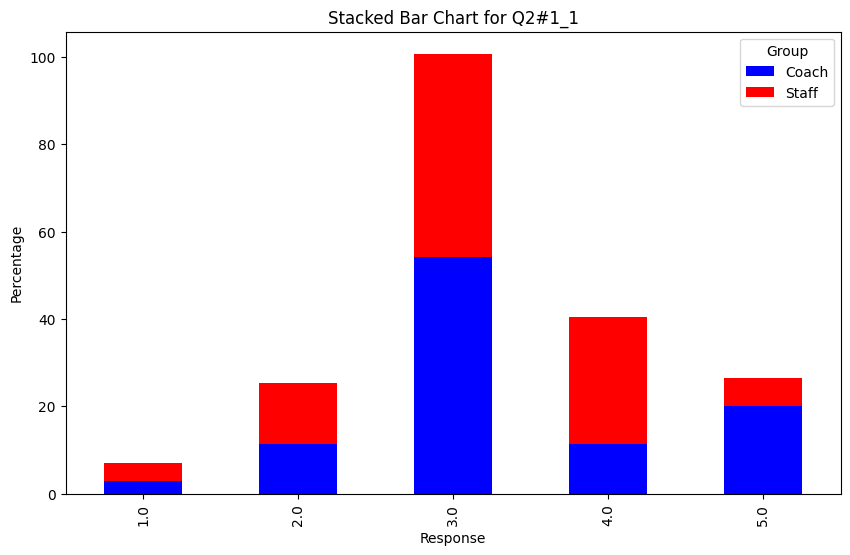

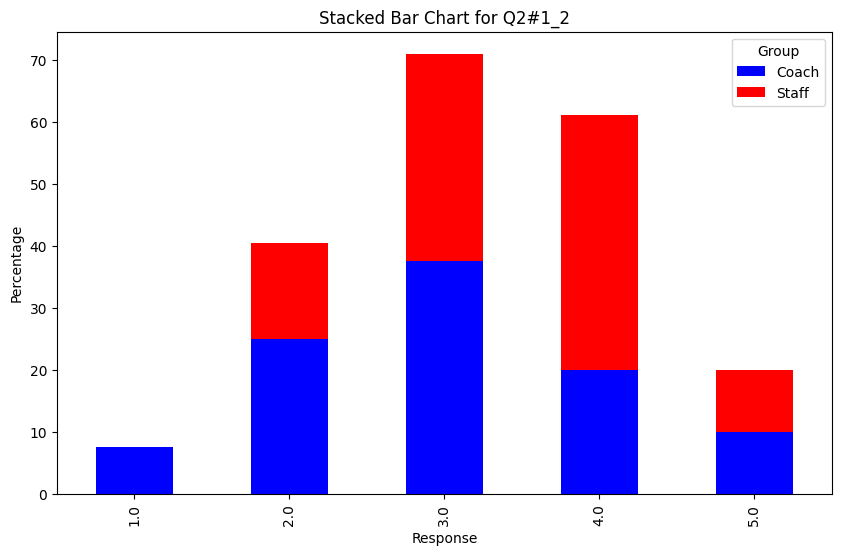

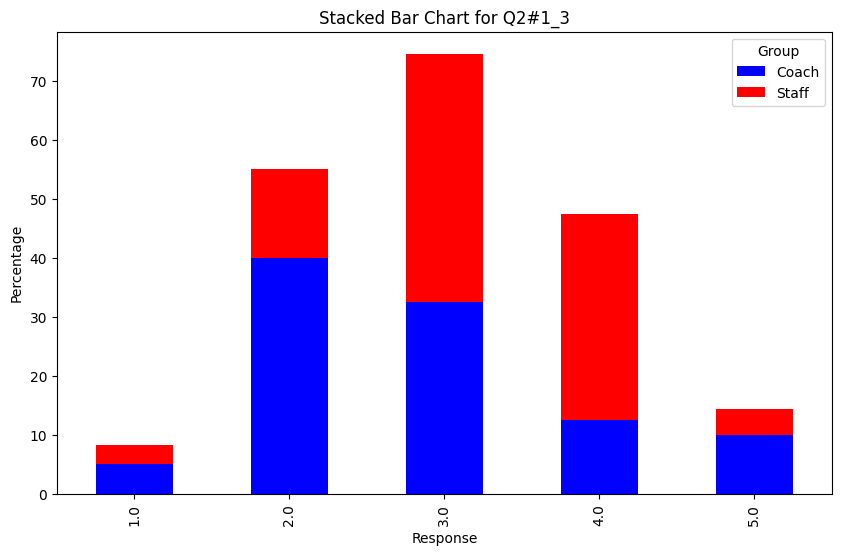

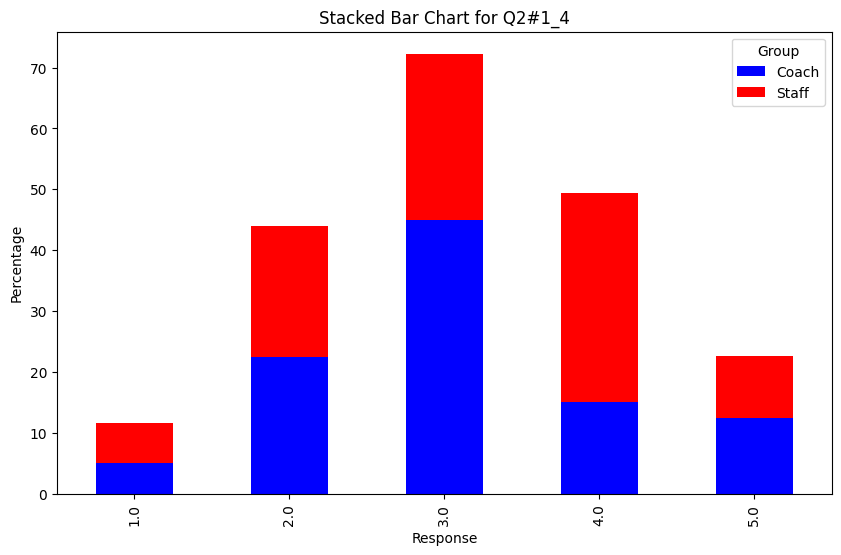

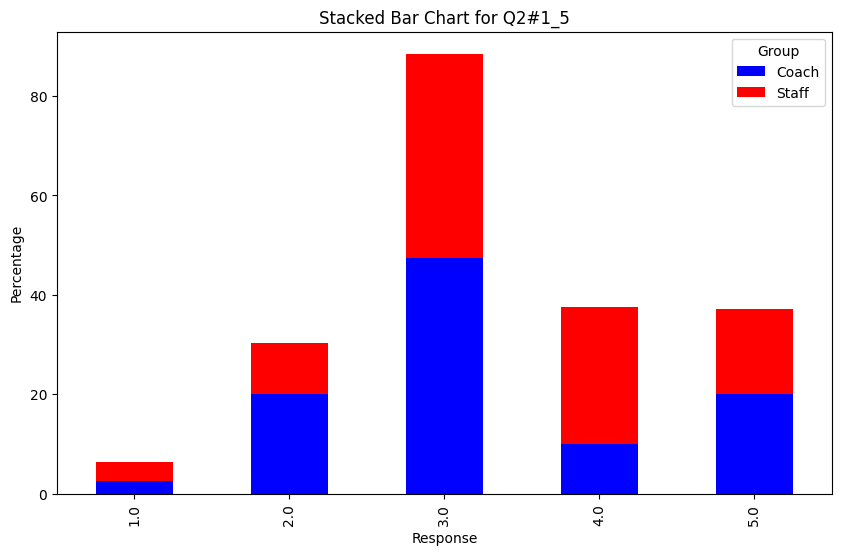

...

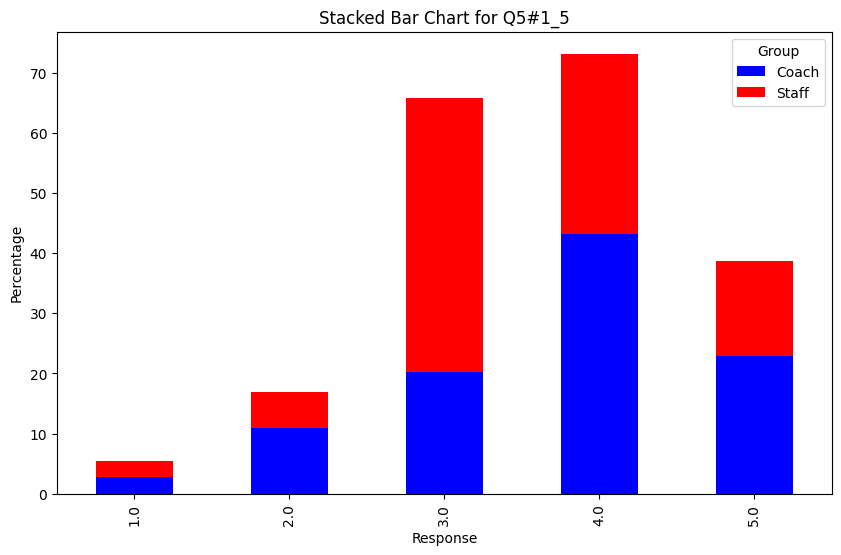

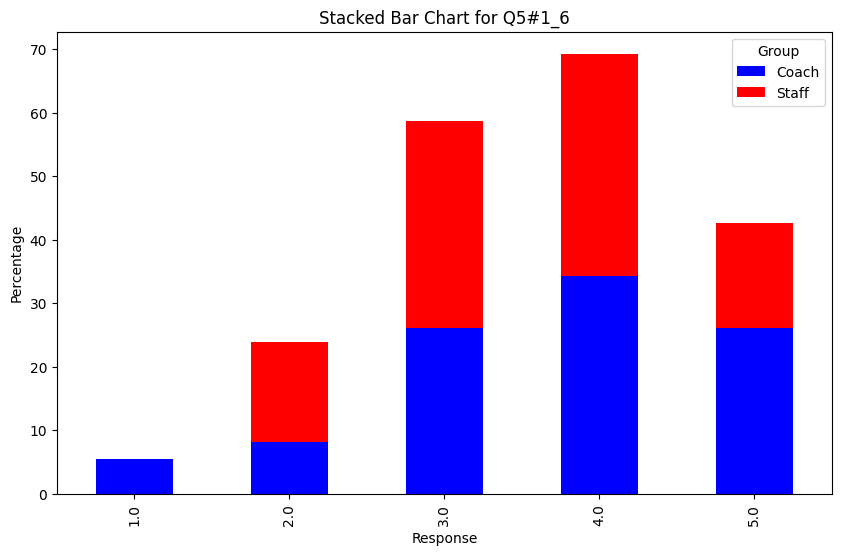

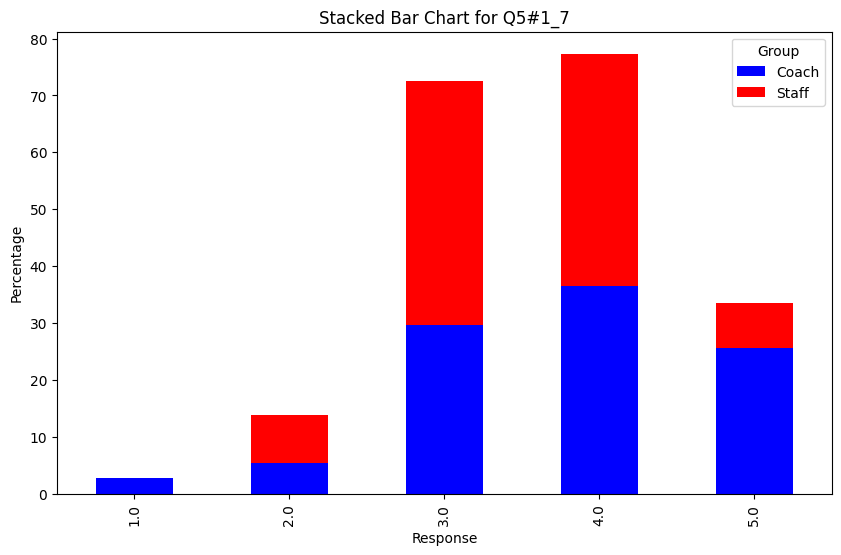

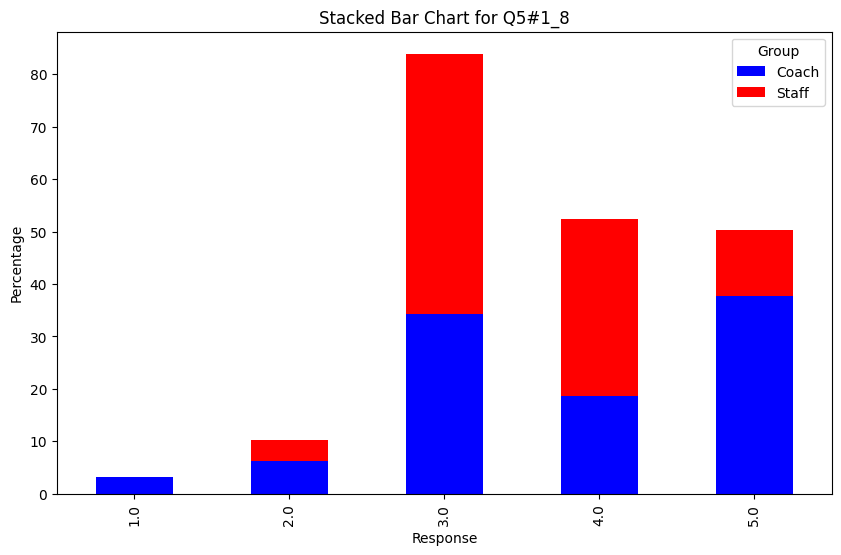

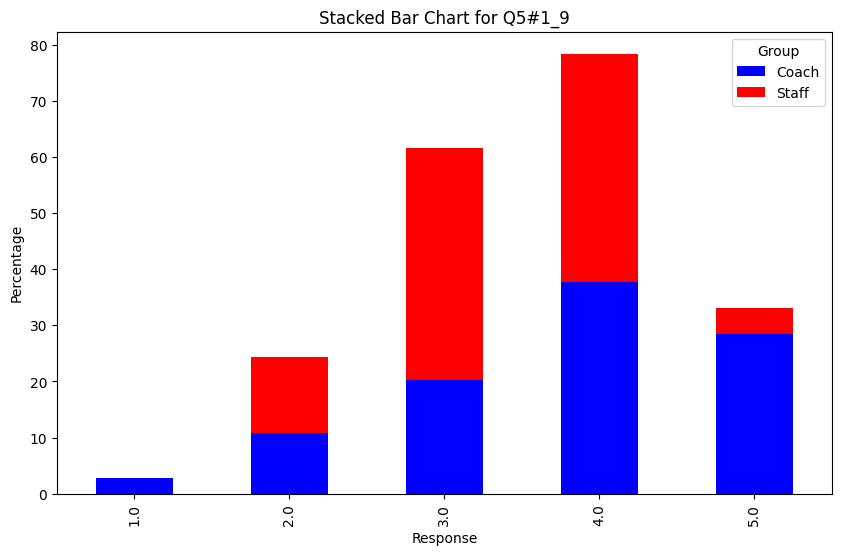

In [69]:
aggregated_data = []

for col in frequency_distribution:
    for group in ['Coach', 'Staff']:
        all_depts_data = pd.DataFrame()
        for dept in frequency_distribution[col]:
            dept_data = frequency_distribution[col][dept][group].reset_index()
            dept_data.columns = ['Response', 'Proportion']
            dept_data['Department'] = dept
            all_depts_data = pd.concat([all_depts_data, dept_data], ignore_index=True)

        # Calculate total counts for each response
        all_depts_data['Count'] = all_depts_data['Proportion'] * all_depts_data.groupby('Department')['Proportion'].transform('count')
        total_counts = all_depts_data.groupby('Response')['Count'].sum().reset_index()
        total_counts.columns = ['Response', 'Total_Count']

        # Calculate the total number of responses
        total_responses = total_counts['Total_Count'].sum()

        # Calculate proportions relative to the total number of responses and convert to percentages
        total_counts['Proportion'] = (total_counts['Total_Count'] / total_responses) * 100
        total_counts['Group'] = group
        total_counts['Question'] = col
        aggregated_data.append(total_counts[['Response', 'Proportion', 'Group', 'Question']])

# Combine all aggregated data into a single DataFrame
plotting_df = pd.concat(aggregated_data, ignore_index=True)

# Print the pivot tables (for debugging/verification purposes)
def print_pivot_table(df, question):
    # Filter data for specific question
    df_filtered = df[df['Question'] == question]

    # Pivot the data to get the proportions for each group
    pivot_df = df_filtered.pivot_table(index='Response', columns='Group', values='Proportion', fill_value=0)

    # Print the pivot table
    print(f"Pivot Table for {question} (in percentages):\n", pivot_df)
    print("\n")

# Print pivot tables for each question
for question in plotting_df['Question'].unique():
    print_pivot_table(plotting_df, question)

# Function to plot stacked bar chart
def plot_stacked_bar(df, question):
    # Filter data for specific question
    df_filtered = df[df['Question'] == question]

    # Pivot the data to get the proportions for each group
    pivot_df = df_filtered.pivot_table(index='Response', columns='Group', values='Proportion', fill_value=0)

    # Plotting
    pivot_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=['blue', 'red'])

    # Add titles and labels
    plt.title(f'Stacked Bar Chart for {question}')
    plt.xlabel('Response')
    plt.ylabel('Percentage')
    plt.legend(title='Group')
    plt.show()

# Plot for each question
for question in plotting_df['Question'].unique():
    plot_stacked_bar(plotting_df, question)

Now this will show me the same as above but instead of listing out coaches and staff it will only show me by department.

Pivot Table for Q2#1_1 (in percentages):
 Department  Academic and Leadership Dev.  External Operations-Com/Dev/Mar  \
Response                                                                    
1.0                             0.000000                         0.000000   
2.0                             0.000000                         8.333333   
3.0                            54.545455                        50.000000   
4.0                            45.454545                        33.333333   
5.0                             0.000000                         8.333333   

Department  Facility, Equipment and Business Operations  Sport Program  \
Response                                                                 
1.0                                                12.5            4.0   
2.0                                                25.0           16.0   
3.0                                                37.5           44.0   
4.0                                             

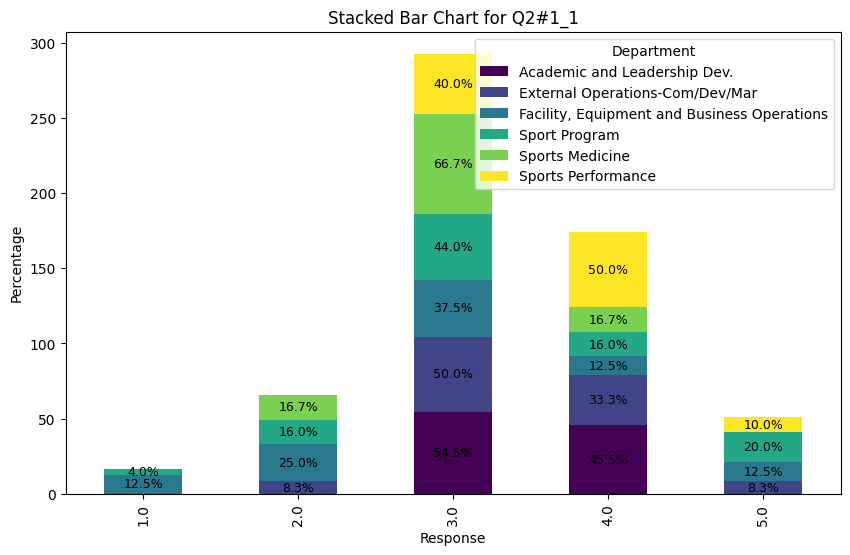

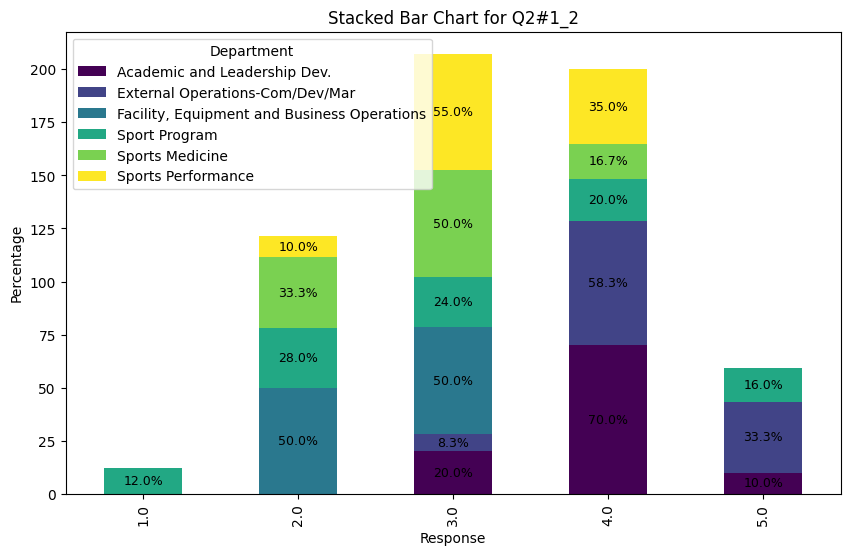

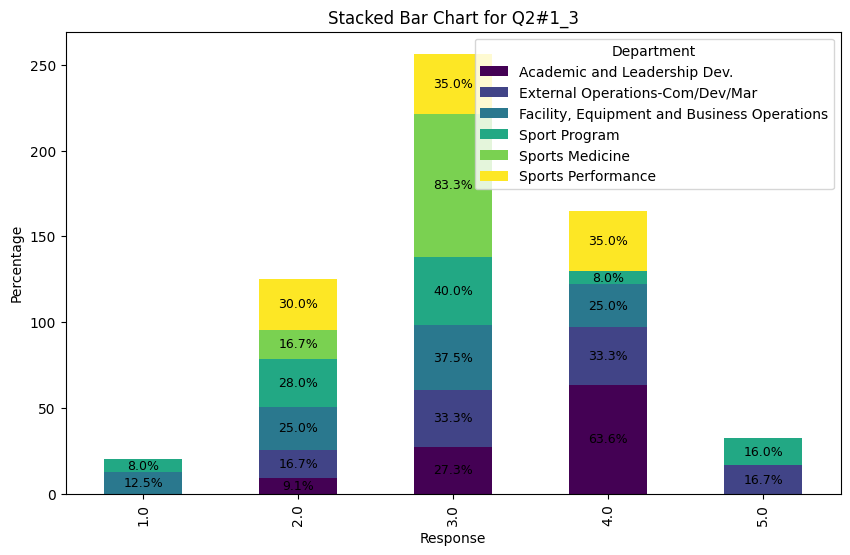

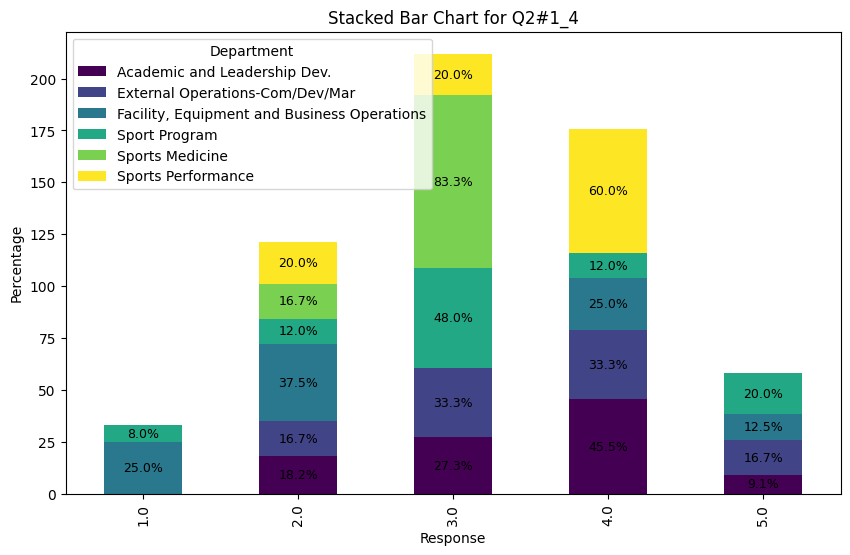

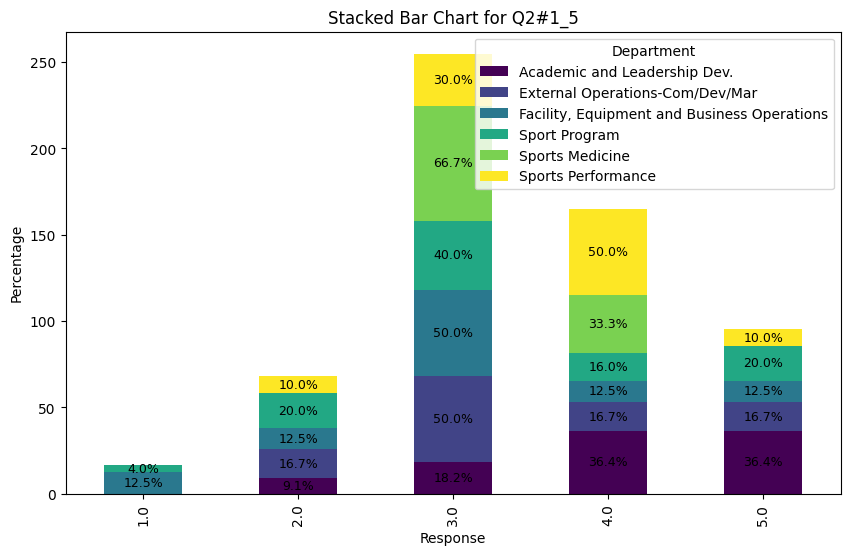

...

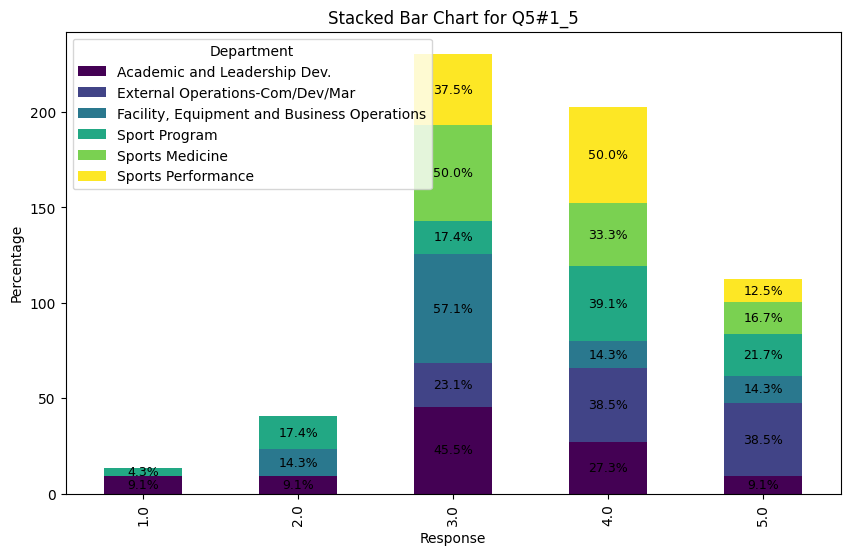

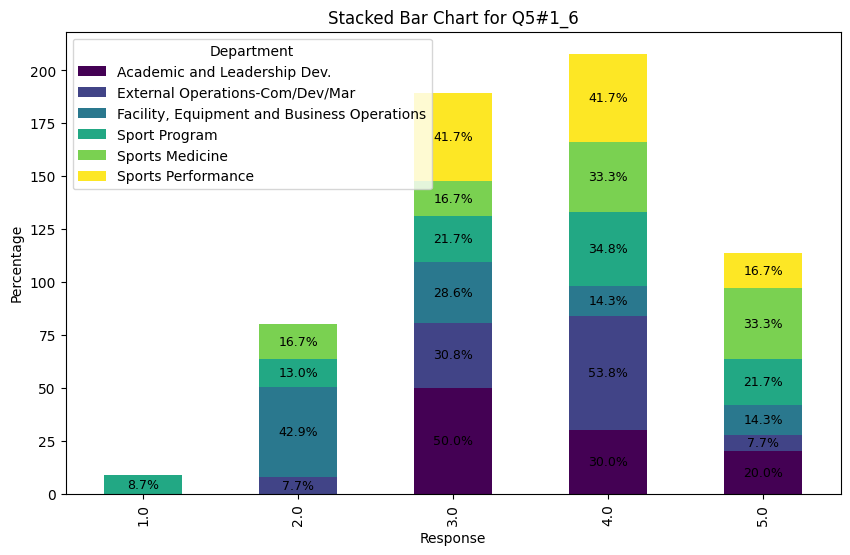

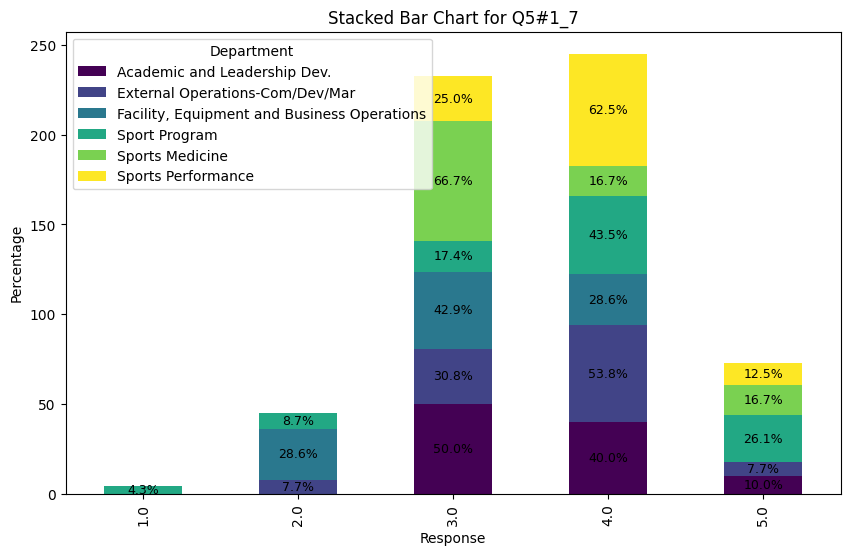

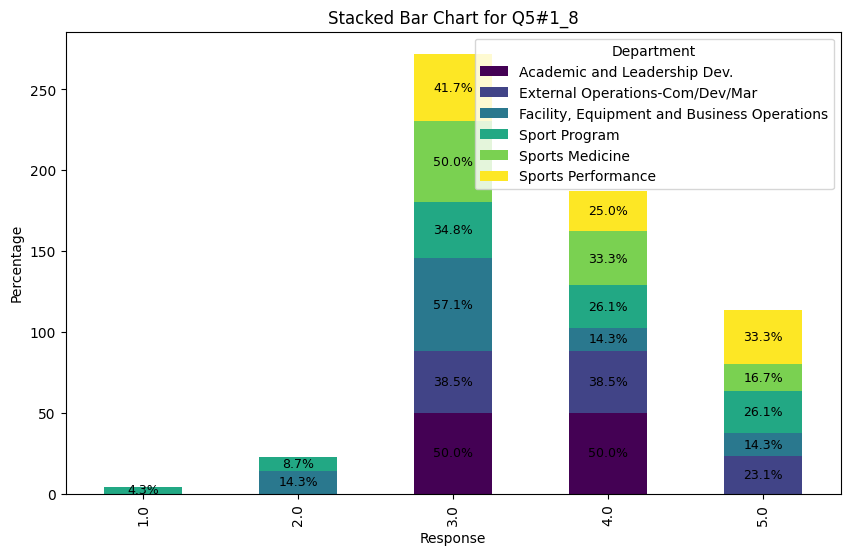

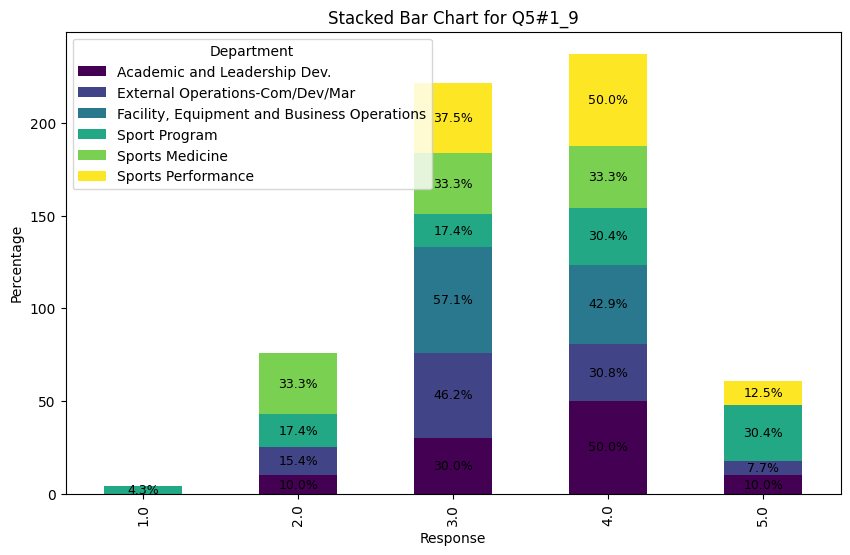

In [70]:
aggregated_data = []

for col in frequency_distribution:
    for dept in frequency_distribution[col]:
        all_groups_data = pd.DataFrame()
        for group in frequency_distribution[col][dept]:
            group_data = frequency_distribution[col][dept][group].reset_index()
            group_data.columns = ['Response', 'Proportion']
            group_data['Group'] = group
            all_groups_data = pd.concat([all_groups_data, group_data], ignore_index=True)

        # Sum the proportions for each response, grouping by the first column (assumed to be 'Response')
        summed_data = all_groups_data.groupby('Response').sum().reset_index()
        summed_data['Proportion'] /= summed_data['Proportion'].sum()  # Normalize to sum to 1
        summed_data['Proportion'] *= 100  # Convert to percentages
        summed_data['Department'] = dept
        summed_data['Question'] = col
        aggregated_data.append(summed_data)

# Combine all aggregated data into a single DataFrame
plotting_df = pd.concat(aggregated_data, ignore_index=True)

# Print the pivot tables (for debugging/verification purposes)
def print_pivot_table(df, question):
    # Filter data for specific question
    df_filtered = df[df['Question'] == question]

    # Pivot the data to get the proportions for each department
    pivot_df = df_filtered.pivot_table(index='Response', columns='Department', values='Proportion', fill_value=0)

    # Print the pivot table
    print(f"Pivot Table for {question} (in percentages):\n", pivot_df)
    print("\n")

# Print pivot tables for each question
for question in plotting_df['Question'].unique():
    print_pivot_table(plotting_df, question)

# Function to add percentage labels to the bars
def add_percentage_labels(ax):
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(f'{height:.1f}%', (p.get_x() + p.get_width() / 2., p.get_y() + height / 2),
                        ha='center', va='center', fontsize=9, color='black', xytext=(0, 0),
                        textcoords='offset points')

# Function to plot stacked bar chart
def plot_stacked_bar(df, question):
    # Filter data for specific question
    df_filtered = df[df['Question'] == question]

    # Pivot the data to get the proportions for each department
    pivot_df = df_filtered.pivot_table(index='Response', columns='Department', values='Proportion', fill_value=0)

    # Plotting
    ax = pivot_df.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='viridis')

    # Add titles and labels
    plt.title(f'Stacked Bar Chart for {question}')
    plt.xlabel('Response')
    plt.ylabel('Percentage')
    plt.legend(title='Department')

    # Add percentage labels
    add_percentage_labels(ax)

    plt.show()

# Plot for each question
for question in plotting_df['Question'].unique():
    plot_stacked_bar(plotting_df, question)